In [3]:
#importing useful packages and modules
import numpy as np
import gala.potential as gp
from gala.units import galactic, solarsystem
import astropy.units as u
from astropy.coordinates.matrix_utilities import rotation_matrix
import astropy.coordinates as coord
import gala.coordinates as gc
import gala.dynamics as gd
import gala.integrate as gi
import matplotlib as mpl
import galstreams

from gala.dynamics import mockstream as ms
from matplotlib import pyplot as plt
_ = coord.galactocentric_frame_defaults.set('v4.0')

# Setting up different scenarios for a MW Potential

In [4]:
#MW Potential- bar, no bulge

disk = gp.MiyamotoNagaiPotential(m=1E11, a=6.5, b=0.27, units=galactic)
halo = gp.NFWPotential(m=5E11,r_s=18,b=0.94,units=galactic) #Pearson et al.2017

bar_static= gp.LongMuraliBarPotential(m=1E10, a=3.5,b=0.5,c=0.5,alpha=-27*u.deg,units=galactic)# parameters from

#specifying rotation
R_array = rotation_matrix(60*u.deg, 'z')
bar_dynamic = gp.LongMuraliBarPotential(m=1E10, a=3.5,b=0.5,c=0.5,alpha=-27*u.deg,units=galactic,R=R_array)

pot1_static = gp.CCompositePotential(disk=disk,halo=halo,bar=bar_static)
pot1_dynamic= gp.CCompositePotential(disk=disk,halo=halo,bar=bar_dynamic)


In [5]:
#MW Potential- bar, bulge

disk = gp.MiyamotoNagaiPotential(m=1E11, a=6.5, b=0.27, units=galactic) #Gala documentation for composite potentials
halo = gp.NFWPotential(m=5E11,r_s=18,b=0.94,units=galactic) #Pearson et al.2017
bulge = gp.HernquistPotential(m=3E10, c=0.7, units=galactic)#Gala documentation for composite potentials

bar_static= gp.LongMuraliBarPotential(m=1E10, a=3.5,b=0.5,c=0.5,alpha=-27*u.deg,units=galactic)# alpha parameter Pearson et al. 2017
pot2_static = gp.CCompositePotential(disk=disk,halo=halo,bulge=bulge,bar=bar_static)

#specifying rotation
# R_array = rotation_matrix(60*u.deg, 'z')
# bar_dynamic = gp.LongMuraliBarPotential(m=1E10, a=3.5,b=0.5,c=0.5,alpha=-27*u.deg,units=galactic,R=R_array)


# pot2_dynamic= gp.CCompositePotential(disk=disk,halo=halo,bulge=bulge,bar=bar_dynamic)


In [6]:
#MW Potential- no bar, bulge

disk = gp.MiyamotoNagaiPotential(m=1E11, a=6.5, b=0.27, units=galactic)
halo = gp.NFWPotential(m=5E11,r_s=18,b=0.94,units=galactic) #in Pearson et al.2017??
bulge = gp.HernquistPotential(m=3E10, c=0.7, units=galactic)


pot3 = gp.CCompositePotential(disk=disk,halo=halo,bulge=bulge)




In [7]:
#MW Potential- no bar, no bulge

disk = gp.MiyamotoNagaiPotential(m=1E11, a=6.5, b=0.27, units=galactic)
halo = gp.NFWPotential(m=5E11,r_s=18,b=0.94,units=galactic) #is b = q in Pearson et al.2017??


pot4 = gp.CCompositePotential(disk=disk,halo=halo)

Text(0.5, 1.0, 'No Bar & No Bulge showing rotation')

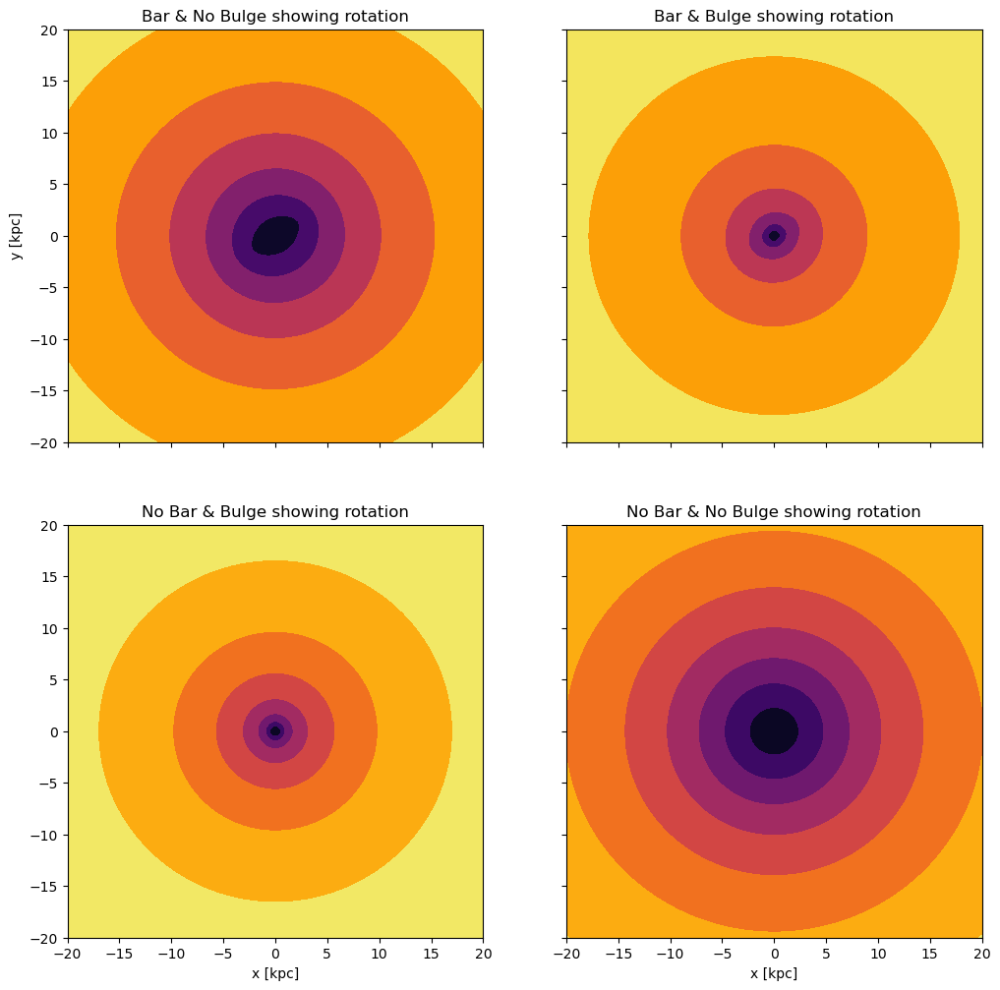

In [8]:
grid = np.linspace(-20, 20, 100)
#fig = pot.plot_contours(grid=(grid, grid, 0)) 
fig, axes = plt.subplots(2, 2, figsize=(12, 12), sharex=True, sharey=True)

pot1_dynamic.plot_contours(grid=(grid, grid, 0),cmap='inferno', ax=axes[0,0]) 
pot2_dynamic.plot_contours(grid=(grid, grid, 0),cmap='inferno', ax=axes[0,1])
pot3.plot_contours(grid=(grid, grid, 0),cmap='inferno',ax=axes[1,0])
pot4.plot_contours(grid=(grid, grid, 0),cmap='inferno',ax=axes[1,1])

#axes[0,0].set_xlabel("x [kpc]") 
#axes[0,1].set_xlabel("x [kpc]") 
axes[1,0].set_xlabel("x [kpc]")
axes[1,1].set_xlabel("x [kpc]")
axes[0,0].set_ylabel("y [kpc]") 

axes[0,0].set_title("Bar & No Bulge showing rotation")
axes[0,1].set_title("Bar & Bulge showing rotation")
axes[1,0].set_title("No Bar & Bulge showing rotation")
axes[1,1].set_title("No Bar & No Bulge showing rotation")

# Bar vs No Bar Potentials

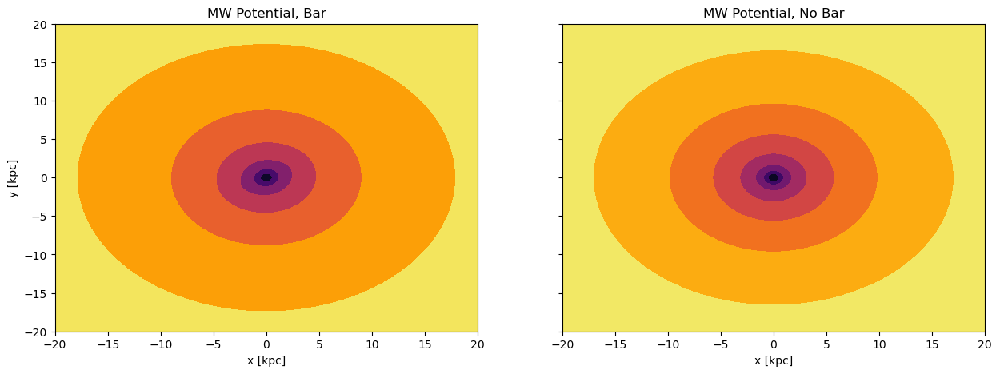

In [41]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharex=True, sharey=True)

pot2_dynamic.plot_contours(grid=(grid,grid,0), ax=axes[0],cmap='inferno')
pot3.plot_contours(grid=(grid, grid, 0), ax=axes[1],cmap='inferno')

axes[0].set_xlabel("x [kpc]") 
axes[1].set_xlabel("x [kpc]") 
axes[0].set_ylabel("y [kpc]") 

axes[0].set_title("MW Potential, Bar")
axes[1].set_title("MW Potential, No Bar")

plt.savefig("Bar-NoBar")
plt.show()

In [10]:
no_bar_pot = pot3

# Preparing barred potential (disk, halo, bulge, bar)

In [11]:
xyz = np.zeros((3, 1024))
xyz[0] = np.linspace(0, 25, xyz.shape[1])

np.where( (xyz[0]>7.99) & (xyz[0]<8.01))

(array([327], dtype=int64),)

244.13606978861534 km / s


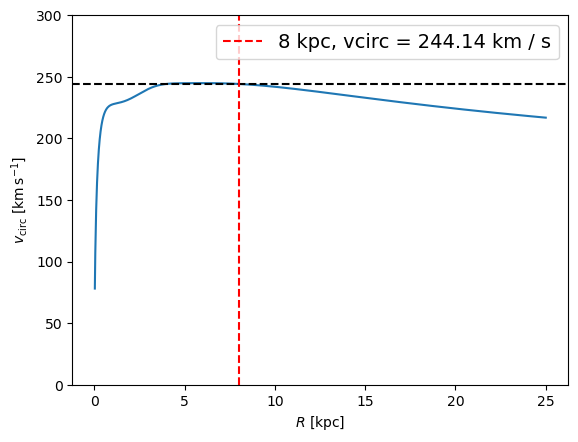

In [12]:
#rotation
barred_pot = pot2_static 
vcirc = barred_pot.circular_velocity(xyz)
print(vcirc[327])

plt.plot(xyz[0], vcirc)#, label=str(pot))
plt.axhline(vcirc[327].value, linestyle='--', color='black')
plt.axvline(8, linestyle='--', color='red', label='8 kpc, vcirc = ' + str(np.round(vcirc[327],2)) )

plt.xlabel('$R$ [kpc]')
plt.ylabel(r'$v_{\rm circ}$ ' + f'[{vcirc.unit:latex_inline}]')

plt.ylim(0, 300)
plt.legend(fontsize=14)

In [13]:
#setting pattern speed
pat_speed = 42. * u.km/u.s/u.kpc #Gala uses this too

In [14]:
#setting up rotating reference frame  
static_frame = gp.StaticFrame(galactic)
rot_frame = gp.ConstantRotatingFrame(pat_speed * [0,0,-1], units=barred_pot.units)
rot_barred_pot = gp.Hamiltonian(barred_pot, rot_frame)
no_bar_pot = gp.Hamiltonian(no_bar_pot, static_frame)

In [29]:
index = np.nanargmin(np.abs(pat_speed*xyz[0]*u.kpc - vcirc)) # parameters for sun's orbit account for the rotating reference frame
v0 = vcirc[index]
R0 = xyz[0][index]
R0, v0

(5.840664711632454, <Quantity 244.80042269 km / s>)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


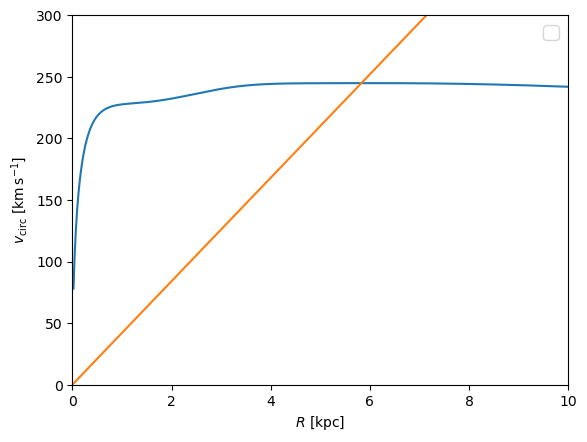

In [30]:
#illustration showing new parameters for sun's orbit (accounting for the rotating reference frame)
plt.plot(xyz[0], vcirc)
plt.plot(xyz[0], pat_speed * (xyz[0]*u.kpc))

plt.xlim(0, 10)
plt.ylim(0, 300)

plt.xlabel('$R$ [kpc]')
plt.ylabel(r'$v_{\rm circ}$ ' + f'[{vcirc.unit:latex_inline}]')

plt.legend(fontsize=14)

In [32]:
sun_w0 = gd.PhaseSpacePosition([-R0, 0, 0] * u.kpc, 
                               [-11.1, 244.8, 7.25] * u.km/u.s) # x & z coordinates from pearson et al. 2017
sun_orbit = rot_barred_pot.integrate_orbit(sun_w0, dt=1, n_steps=10000, 
                              Integrator=gi.DOPRI853Integrator)

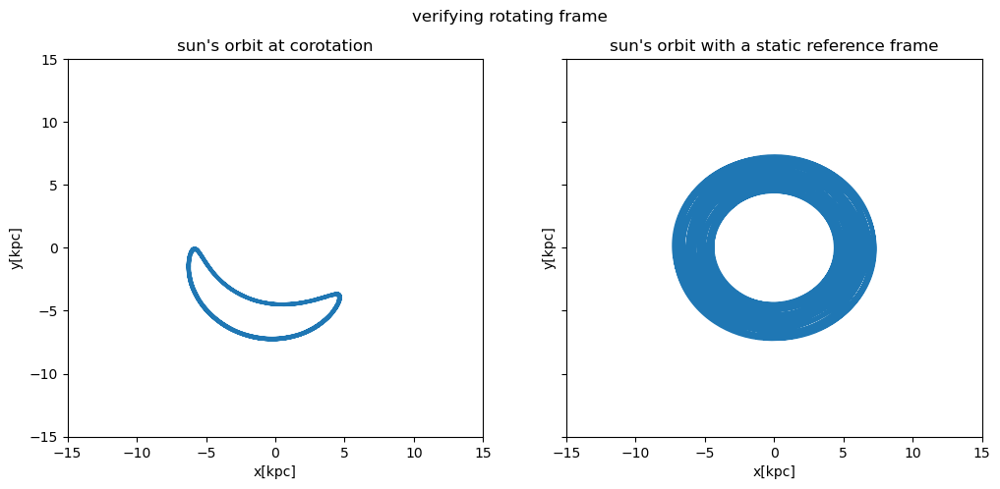

In [38]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5), sharex=True, sharey=True)

ax[0].plot(sun_orbit.x,sun_orbit.y) 
ax[1].plot(sun_orbit.to_frame(static_frame).x, sun_orbit.to_frame(static_frame).y)

ax[0].set_xlim(-15, 15)
ax[1].set_xlim(-15, 15)              
ax[0].set_ylim(-15, 15)

fig.suptitle("verifying rotating frame")
ax[0].set_title("sun's orbit at corotation")
ax[1].set_title("sun's orbit with a static reference frame")

ax[0].set_xlabel('x[kpc]') 
ax[0].set_ylabel('y[kpc]') 

ax[1].set_ylabel('y[kpc]')
ax[1].set_xlabel('x[kpc]') 

plt.savefig("corotation")

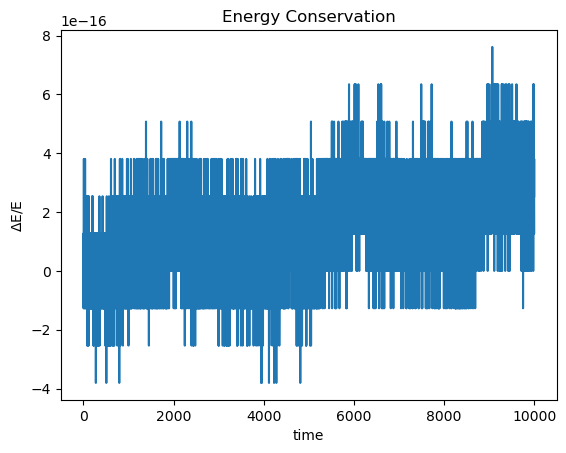

In [39]:
#checking energy conservation
Ej = sun_orbit.energy()
plt.plot((Ej[1:] - Ej[0]) / Ej[0])

plt.xlabel('time')
plt.ylabel("$\Delta$E/E")
plt.title("Energy Conservation")

plt.savefig("energy conservation")

# Stream Simulations

In [36]:
#setting constant mass parameter for streams' progenitor

const_pro_mass = 3e4 * u.Msun #Boyles J. et al. 2011
const_pro_pot = gp.PlummerPotential(m=const_pro_mass, b=4*u.pc, units=galactic)

#setting distribution function
df = ms.FardalStreamDF()

v_sun = coord.CartesianDifferential([8.4, 244.8, 8.4]*u.km/u.s)
galcen_frame = coord.Galactocentric(galcen_distance=8.275*u.kpc,
                                    galcen_v_sun=v_sun)



In [19]:
mws = galstreams.MWStreams(verbose=False, implement_Off=False)

Initializing galstreams library from master_log... 


In [20]:
#setting constant time for integrating orbits
t_orbit = 3*u.Gyr
#setting time step for mock stream and orbit integration
timestep = 0.01

In [21]:
def generate_stream(stream_pro,df,pot,const_pro_pot,const_pro_mass,step,nsteps):
    #setting initial conditions such that progenitor ends up in the present position of the cluster

    stream_pro = stream_pro

    #convert to galactocentric coordinates and get 6D 
    stream_w0 = gd.PhaseSpacePosition(stream_pro.transform_to(galcen_frame).cartesian)

    #creating mockstream
    gen_stream = ms.MockStreamGenerator(df, pot,
                                      progenitor_potential=const_pro_pot)
    stream, pro_now = gen_stream.run(stream_w0, const_pro_mass,
                                  dt=-step * u.Myr, n_steps=nsteps, release_every=1, n_particles=1) #5 Gyr
    return stream, pro_now

In [22]:
def plot_streams(stream_bar, stream_nobar,orbit_bar,orbit_nobar, stream_track, pro_ra, pro_dec, pat_speed=42 * u.km/u.s/u.kpc,xlim=(400,100),ylim=(-80,80)):
    stream_icrs_bar = stream_bar.to_coord_frame(coord.ICRS, galactocentric_frame=galcen_frame)
    stream_icrs_nobar = stream_nobar.to_coord_frame(coord.ICRS, galactocentric_frame=galcen_frame)

    fig, axes = plt.subplots(5, 2, figsize=(18, 18), sharex=True, sharey=True)

    #########################################################
    axes[0,0].scatter(stream_icrs_bar.ra, stream_icrs_bar.dec, s=1, alpha=0.2, label= str(pat_speed) + '\npericenter= '+ str(np.round(orbit_bar.pericenter(),2)))
    axes[0,0].scatter(pro_ra, pro_dec, c='red', s=15, label='progenitor') #to show position of progenitor
    axes[0,0].plot(mws[stream_track].track.ra, mws[stream_track].track.dec,'.', label=stream_track, c='green')
    
    axes[0,1].scatter(stream_icrs_nobar.ra, stream_icrs_nobar.dec, s=1, alpha=0.2, label= str(pat_speed) + '\npericenter= '+ str(np.round(orbit_nobar.pericenter(),2)))
    axes[0,1].scatter(pro_ra, pro_dec, c='red', s=15, label='progenitor') #to show position of progenitor
    axes[0,1].plot(mws[stream_track].track.ra, mws[stream_track].track.dec,'.', label=stream_track, c='green')
    
    #########################################################   
    
    im10 = axes[1,0].scatter(stream_icrs_bar.ra, stream_icrs_bar.dec, c=stream_bar.release_time, cmap='viridis', s=1, alpha=0.2, label= str(pat_speed) + '\npericenter= '+ str(np.round(orbit_bar.pericenter(),2)))
    axes[1,0].scatter(pro_ra, pro_dec, c='red', s=15, label='progenitor') #to show position of progenitor
    
    
    im11 = axes[1,1].scatter(stream_icrs_nobar.ra, stream_icrs_nobar.dec, c=stream_nobar.release_time, cmap='viridis', s=1, alpha=0.2, label= str(pat_speed) + '\npericenter= '+ str(np.round(orbit_nobar.pericenter(),2)))
    axes[1,1].scatter(pro_ra, pro_dec, c='red', s=15, label='progenitor') #to show position of progenitor
    
    
    pm_ra01, pm_dec02 = stream_icrs_bar.proper_motion
    pm20 = np.sqrt(pm_ra01**2 + pm_dec02**2)
    
    pm_ra11, pm_dec12 = stream_icrs_nobar.proper_motion
    pm21 = np.sqrt(pm_ra11**2 + pm_dec12**2)
    
    
    im20 = axes[2,0].scatter(stream_icrs_bar.ra, stream_icrs_bar.dec, c=pm20, cmap='viridis', s=1, alpha=0.2, label= str(pat_speed) + '\npericenter= '+ str(np.round(orbit_bar.pericenter(),2)))
    axes[2,0].scatter(pro_ra, pro_dec, c='red', s=15, label='progenitor') #to show position of progenitor
    
    im21 = axes[2,1].scatter(stream_icrs_nobar.ra, stream_icrs_nobar.dec, c=pm21, cmap='viridis', s=1, alpha=0.2, label= str(pat_speed) + '\npericenter= '+ str(np.round(orbit_nobar.pericenter(),2)))
    axes[2,1].scatter(pro_ra, pro_dec, c='red', s=15, label='progenitor') #to show position of progenitor
    
    im30 = axes[3,0].scatter(stream_icrs_bar.ra, stream_icrs_bar.dec, c=stream_bar.energy(rot_barred_pot), cmap='viridis', s=1, alpha=0.2, label= str(pat_speed) + '\npericenter= '+ str(np.round(orbit_bar.pericenter(),2)))
    axes[3,0].scatter(pro_ra, pro_dec, c='red', s=15, label='progenitor') #to show position of progenitor
    
    im31 = axes[3,1].scatter(stream_icrs_nobar.ra, stream_icrs_nobar.dec, c=stream_nobar.energy(no_bar_pot), cmap='viridis', s=1, alpha=0.2, label= str(pat_speed) + '\npericenter= '+ str(np.round(orbit_nobar.pericenter(),2)))
    axes[3,1].scatter(pro_ra, pro_dec, c='red', s=15, label='progenitor') #to show position of progenitor
    
    
    L400,L401,L402 = stream_bar.angular_momentum()
    L40 = np.sqrt(L400**2 + L401**2 + L402**2)
    
    L410,L411,L412 = stream_nobar.angular_momentum()
    L41 = np.sqrt(L410**2 + L411**2 + L412**2)
    
    
    im40 = axes[4,0].scatter(stream_icrs_bar.ra, stream_icrs_bar.dec, c=L40, cmap='viridis', s=1, alpha=0.2, label= str(pat_speed) + '\npericenter= '+ str(np.round(orbit_bar.pericenter(),2)))
    axes[4,0].scatter(pro_ra, pro_dec, c='red', s=15, label='progenitor') #to show position of progenitor
    
    im41 = axes[4,1].scatter(stream_icrs_nobar.ra, stream_icrs_nobar.dec, c=L41, cmap='viridis', s=1, alpha=0.2, label= str(pat_speed) + '\npericenter= '+ str(np.round(orbit_nobar.pericenter(),2)))
    axes[4,1].scatter(pro_ra, pro_dec, c='red', s=15, label='progenitor') #to show position of progenitor
    
    
    axes[0,0].set_xlabel("ra [deg]") 
    axes[0,0].set_ylabel("dec [deg]") 
    axes[0,1].set_xlabel("ra [deg]")
    axes[0,1].set_ylabel("dec [deg]")
 
    axes[1,0].set_xlabel("ra [deg]") 
    axes[1,0].set_ylabel("dec [deg]")
    axes[1,1].set_xlabel("ra [deg]")
    axes[1,1].set_ylabel("dec [deg]")
    
    axes[2,0].set_xlabel("ra [deg]") 
    axes[2,1].set_ylabel("dec [deg]")
    axes[2,1].set_xlabel("ra [deg]")
    axes[2,1].set_ylabel("dec [deg]")
    
    axes[3,0].set_xlabel("ra [deg]")
    axes[3,0].set_ylabel("dec [deg]")
    axes[3,1].set_xlabel("ra [deg]")
    axes[3,1].set_ylabel("dec [deg]")

    axes[4,0].set_xlabel("ra [deg]")
    axes[4,0].set_ylabel("dec [deg]")
    axes[4,1].set_xlabel("ra [deg]") 
    axes[4,1].set_ylabel("dec [deg]")

    axes[0,0].set_title("In MW (rotating) potential", fontsize = 15)
    axes[0,1].set_title("In MW no bar potential", fontsize = 15)
    
    #setting x and y limit for all subplots
    axes[0,0].set_xlim(xlim) 
    axes[0,1].set_ylim(ylim) 
    
    axes[1,0].set_xlim(xlim) 
    axes[1,1].set_ylim(ylim)
    
    axes[2,0].set_xlim(xlim) 
    axes[2,1].set_ylim(ylim)
    
    axes[3,0].set_xlim(xlim) 
    axes[3,1].set_ylim(ylim)
    
    axes[4,0].set_xlim(xlim)
    axes[4,1].set_ylim(ylim)
    
    #setting legends for all subplots
    axes[0,0].legend(fontsize = 12, loc='lower right')
    axes[0,1].legend(fontsize = 12, loc='lower right')
    
    axes[1,0].legend(fontsize = 12, loc='lower right')
    axes[1,1].legend(fontsize = 12, loc='lower right')
    
    axes[2,0].legend(fontsize = 12, loc='lower right')
    axes[2,1].legend(fontsize = 12, loc='lower right')
    
    axes[3,0].legend(fontsize = 12, loc='lower right')
    axes[3,1].legend(fontsize = 12, loc='lower right')
    
    axes[4,0].legend(fontsize = 12, loc='lower right')
    axes[4,1].legend(fontsize = 12, loc='lower right')
    
    #setting colorbar
    cbar10 = fig.colorbar(im10, ax=axes[1,0])
    cbar10.set_label('Release Time')
    
    cbar11 = fig.colorbar(im11, ax=axes[1,1])
    cbar11.set_label('Release Time')
    
    
    cbar20 = fig.colorbar(im20, ax=axes[2,0])
    cbar20.set_label('Proper motion')
    
    cbar21 = fig.colorbar(im21, ax=axes[2,1])
    cbar21.set_label('Proper motion')
    
    
    cbar30 = fig.colorbar(im30, ax=axes[3,0])
    cbar30.set_label('Energy')
    
    cbar31 = fig.colorbar(im31, ax=axes[3,1])
    cbar31.set_label('Energy')
    
    
    cbar40 = fig.colorbar(im40, ax=axes[4,0])
    cbar40.set_label('Angular Momentum')
    
    cbar41 = fig.colorbar(im41, ax=axes[4,1])
    cbar41.set_label('Angular Momentum')
    
    plt.show()

# For Palomar 5

Pal 5 in a MW rotating bar potential 

In [52]:
pal5_pro = coord.ICRS(ra=229.65*u.degree, dec= 0.26*u.degree, #malhan et al. 2022 (also, consider using skycoord)
                   distance=20.16*u.kpc, #malhan et al. 2022 
                   pm_ra_cosdec= -2.75*u.mas/u.yr, #malhan et al. 2022
                   pm_dec=-2.68*u.mas/u.yr, #malhan et al. 2022
                   radial_velocity= -57.03*u.km/u.s) #malhan et al. 2022

In [59]:
#integrating the stream
pal5_stream_bar, pal5_pro_now_bar = generate_stream(pal5_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass,step=1,nsteps=4000)

In [60]:
#integrating the just the orbit
pal5_w0_bar = gd.PhaseSpacePosition(pal5_pro.transform_to(galcen_frame).cartesian)
pal5_orbit_bar = rot_barred_pot.integrate_orbit(pal5_w0_bar, dt=1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

Pal 5 in a MW no bar potential 

In [61]:
#integrating the stream
pal5_stream_nobar, pal5_pro_now_nobar = generate_stream(pal5_pro, df, no_bar_pot, const_pro_pot,const_pro_mass,step=1,nsteps=4000)

In [62]:
#dir(pal5_stream_bar) 
#pal5_orbit_bar.t

In [63]:
#integrating the just the orbit
pal5_w0_nobar = gd.PhaseSpacePosition(pal5_pro.transform_to(galcen_frame).cartesian)
pal5_orbit_nobar = no_bar_pot.integrate_orbit(pal5_w0_nobar, dt=1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

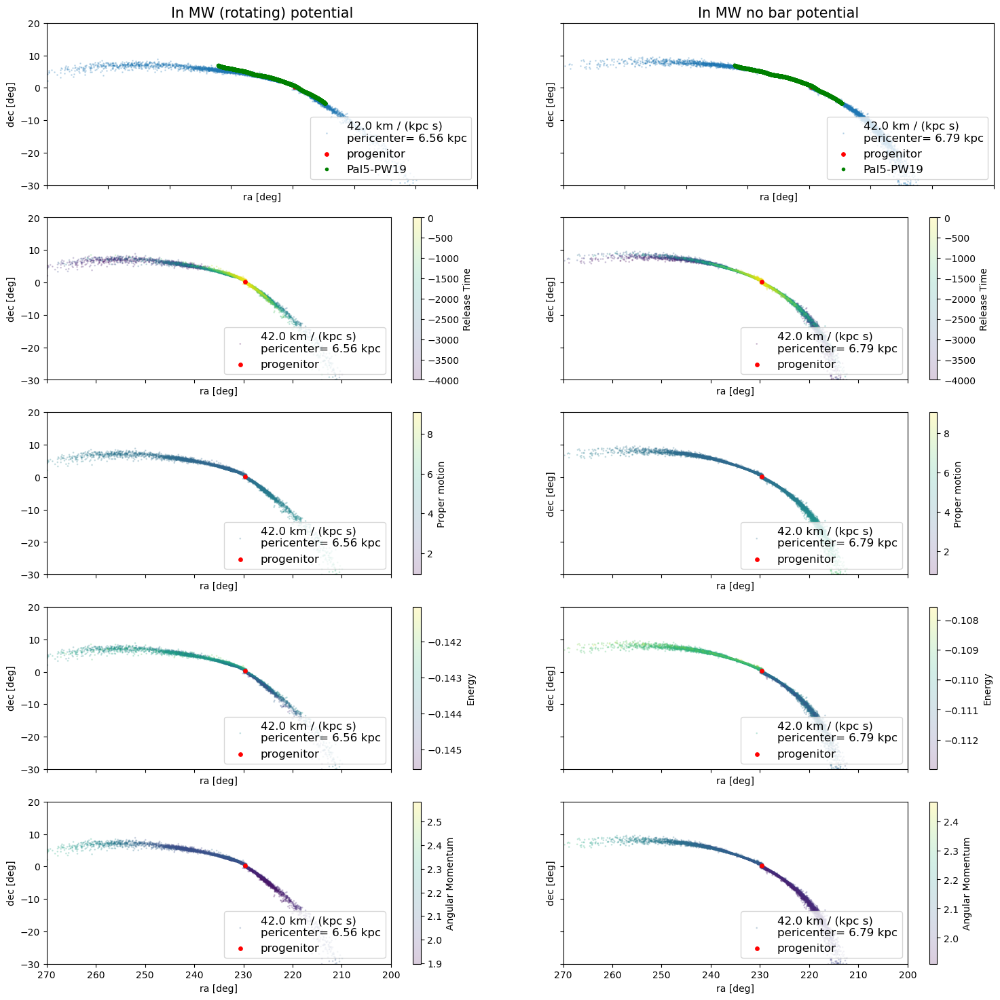

In [64]:
pal5_track = mws.get_track_names_for_stream('Pal5', On_only=True)[0]
plot_streams(
    pal5_stream_bar, 
    pal5_stream_nobar, 
    pal5_orbit_bar, 
    pal5_orbit_nobar,
    pal5_track,
    pro_ra=229.65*u.degree,
    pro_dec=0.26*u.degree,
    xlim=(270,200), 
    ylim=(-30,20)
)


# For Ophiuchus

Ophiuchus in a MW rotating bar potential 

In [104]:
ophiuchus_pro = coord.ICRS(ra=242.04*u.degree, dec= -6.61*u.degree, 
                   distance=8.2*u.kpc, 
                   pm_ra_cosdec= -6.63*u.mas/u.yr, 
                   pm_dec=-4.37*u.mas/u.yr, 
                   radial_velocity= 289.1*u.km/u.s) 

#ra=242.04*u.degree, dec= -6.61*u.degree
#ra=242.5*u.degree, dec= -6.7089*u.degree

In [105]:
ophiuchus_stream_bar, ophiuchus_pro_now_bar = generate_stream(ophiuchus_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass,step=1,nsteps=5000)

In [106]:
#integrating the just the orbit
ophiuchus_w0_bar = gd.PhaseSpacePosition(ophiuchus_pro.transform_to(galcen_frame).cartesian)
ophiuchus_orbit_bar = rot_barred_pot.integrate_orbit(ophiuchus_w0_bar, dt=1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

Ophiuchus in a MW no bar potential 

In [107]:
ophiuchus_stream_nobar, ophiuchus_pro_now_nobar = generate_stream(ophiuchus_pro, df, no_bar_pot, const_pro_pot,const_pro_mass,step=1,nsteps=5000)

In [108]:
#integrating the just the orbit
ophiuchus_w0_nobar = gd.PhaseSpacePosition(ophiuchus_pro.transform_to(galcen_frame).cartesian)
ophiuchus_orbit_nobar = no_bar_pot.integrate_orbit(ophiuchus_w0_nobar, dt=1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

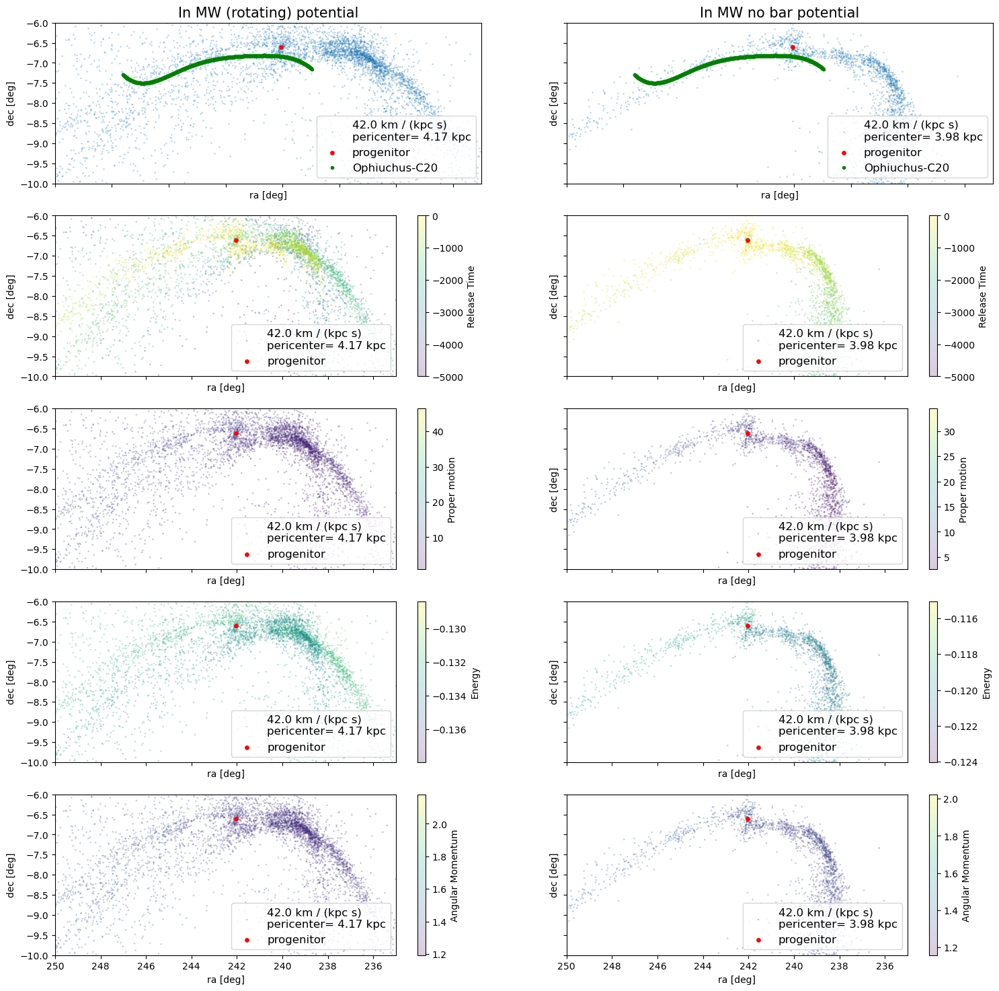

In [170]:
ophiuchus_track = mws.get_track_names_for_stream('Ophiuchus', On_only=True)[0]
plot_streams(ophiuchus_stream_bar, 
             ophiuchus_stream_nobar, 
             ophiuchus_orbit_bar,
             ophiuchus_orbit_nobar,
             ophiuchus_track,
             pro_ra=242.04*u.degree,
             pro_dec=-6.61*u.degree,
             xlim=(250, 235), 
             ylim=(-10, -6)
) 

# For Hrid

In [99]:
hrid_pro = coord.ICRS(ra=280.51*u.degree, dec= 33.3*u.degree, 
                   distance=2.75*u.kpc, 
                   pm_ra_cosdec= -5.88*u.mas/u.yr, 
                   pm_dec=20.08*u.mas/u.yr, 
                   radial_velocity= -238.77*u.km/u.s) 

In MW (rotating bar) potential

In [100]:
hrid_stream_bar, hrid_pro_now_bar = generate_stream(hrid_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass)

In [101]:
#integrating the just the orbit
hrid_w0_bar = gd.PhaseSpacePosition(hrid_pro.transform_to(galcen_frame).cartesian)
hrid_orbit_bar = rot_barred_pot.integrate_orbit(hrid_w0_bar, dt=0.1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

In MW (no bar) potential

In [102]:
hrid_stream_nobar, hrid_pro_now_nobar = generate_stream(hrid_pro, df, no_bar_pot, const_pro_pot,const_pro_mass)

In [103]:
#integrating the just the orbit
hrid_w0_nobar = gd.PhaseSpacePosition(hrid_pro.transform_to(galcen_frame).cartesian)
hrid_orbit_nobar = no_bar_pot.integrate_orbit(hrid_w0_nobar, dt=0.1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

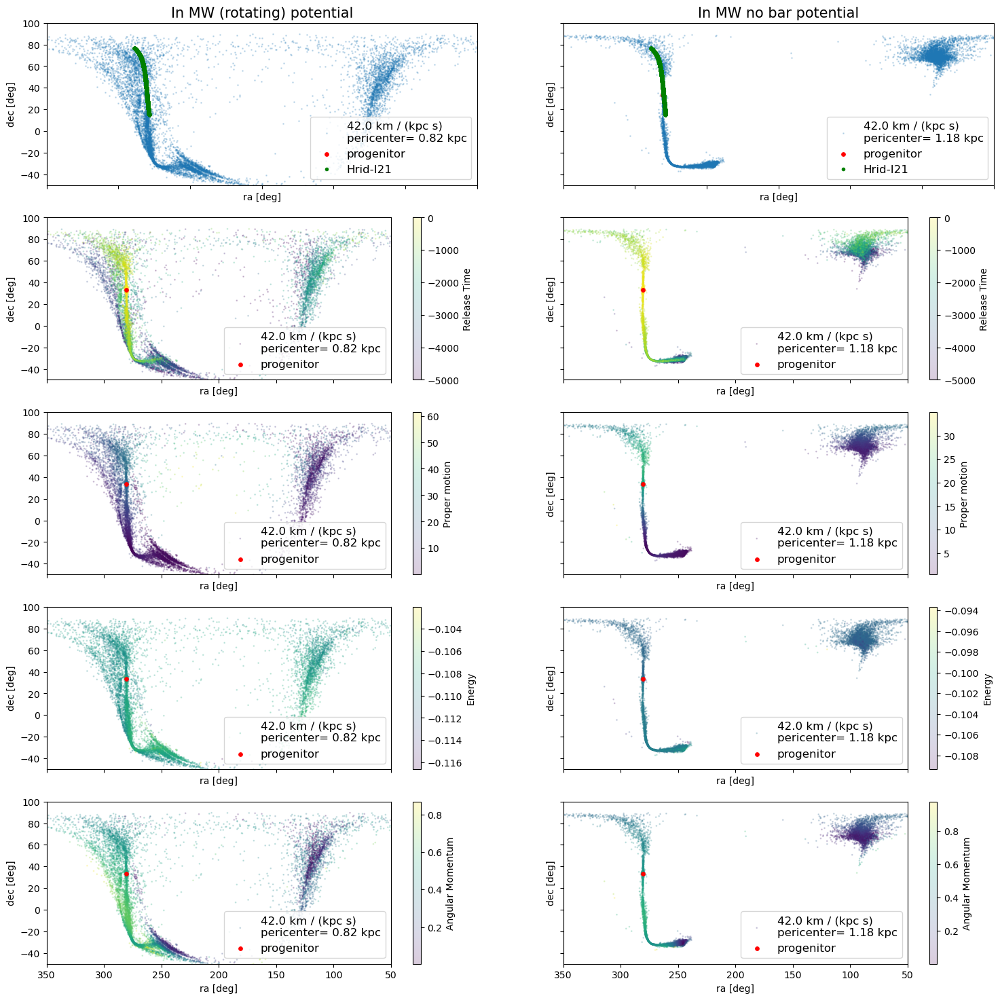

In [176]:
hrid_track = mws.get_track_names_for_stream('Hrid')[0]
plot_streams(hrid_stream_bar, 
             hrid_stream_nobar,
             hrid_orbit_bar, 
             hrid_orbit_nobar,
             hrid_track,
             pro_ra=280.51*u.degree,
             pro_dec=33.3*u.degree,
             xlim=(350, 50), 
             ylim=(-50,100), 
            )

#plt.scatter(280.51, 33.3, c='red')

# For Fjorm

In [42]:
fjorm_pro = coord.ICRS(ra=251.89*u.degree, dec= 65.38*u.degree, 
                   distance=4.90*u.kpc, 
                   pm_ra_cosdec= 3.92*u.mas/u.yr, 
                   pm_dec=3.1*u.mas/u.yr, 
                   radial_velocity= -25.37*u.km/u.s) 

In MW (rotating bar) potential

In [43]:
fjorm_stream_bar, fjorm_pro_now_bar = generate_stream(fjorm_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass,step=1,nsteps=5000)

In [44]:
#integrating the just the orbit
fjorm_w0_bar = gd.PhaseSpacePosition(fjorm_pro.transform_to(galcen_frame).cartesian)
fjorm_orbit_bar = rot_barred_pot.integrate_orbit(fjorm_w0_bar, dt=0.1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

In MW (no bar) potential

In [45]:
fjorm_stream_nobar, _pro_now_nobar = generate_stream(fjorm_pro, df, no_bar_pot, const_pro_pot,const_pro_mass,step=1,nsteps=5000)

In [46]:
#integrating the just the orbit
fjorm_w0_nobar = gd.PhaseSpacePosition(fjorm_pro.transform_to(galcen_frame).cartesian)
fjorm_orbit_nobar = no_bar_pot.integrate_orbit(fjorm_w0_nobar, dt=0.1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

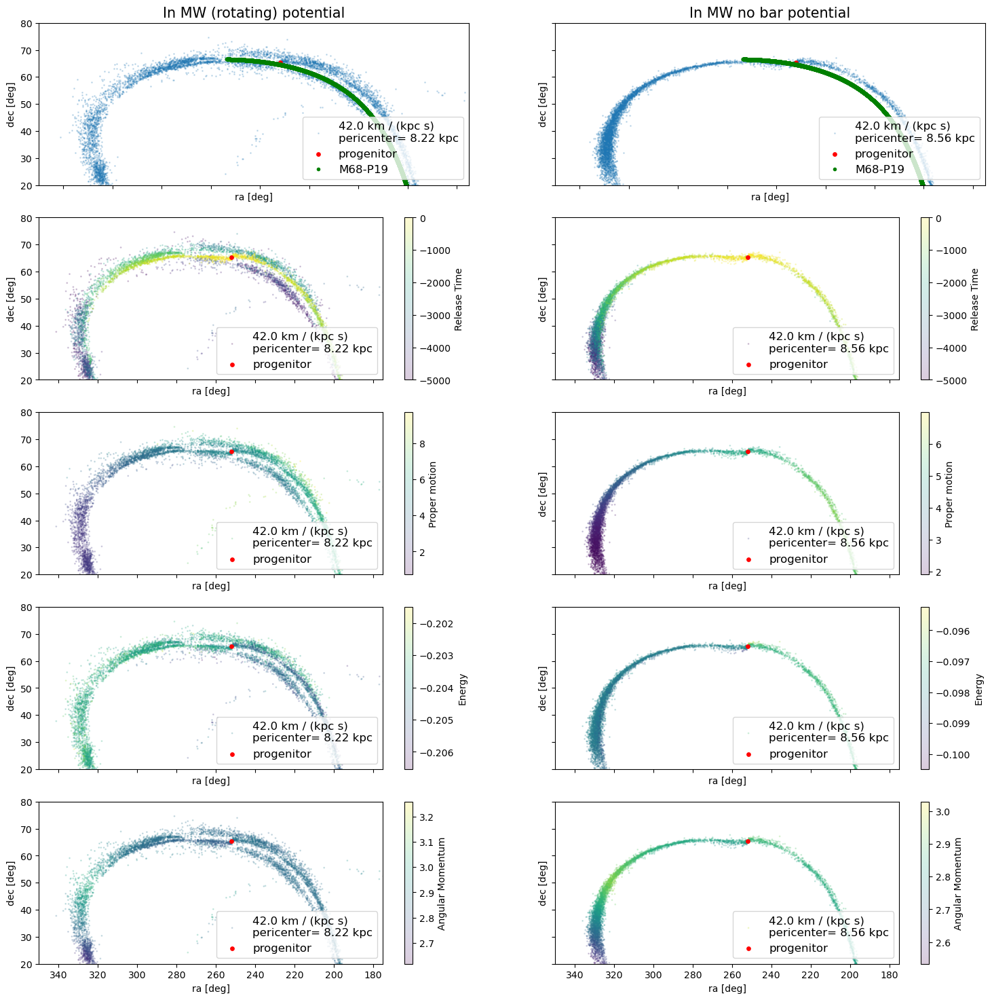

In [47]:
fjorm_track = mws.get_track_names_for_stream('Fjorm', On_only=True)[0]
plot_streams(fjorm_stream_bar, 
             fjorm_stream_nobar,
             fjorm_orbit_bar, 
             fjorm_orbit_nobar,
             fjorm_track,
             pro_ra=251.89*u.degree,
             pro_dec=65.38*u.degree,
             xlim=(350, 175), 
             ylim=(20, 80)) 
#plt.scatter(251.89*u.degree, 65.38*u.degree, c='red')

# For Svol


In [38]:
svol_pro = coord.ICRS(ra=239.80*u.degree, dec= 26.73*u.degree, 
                   distance=7.76*u.kpc, 
                   pm_ra_cosdec= 2.973*u.mas/u.yr, 
                   pm_dec=-6.1499*u.mas/u.yr, 
                   radial_velocity= -173.2439*u.km/u.s) 

For time step of 1 Myr and nsteps of 5000 equivalent of (5 Gyr)

In MW (rotating bar) potential

In [44]:
svol_stream_bar, svol_pro_now_bar = generate_stream(svol_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass,step=1,nsteps=3000)

In [45]:
#integrating the just the orbit with the Dormand Prince 85(3) integration scheme
svol_w0_bar = gd.PhaseSpacePosition(svol_pro.transform_to(galcen_frame).cartesian)
svol_orbit_bar = rot_barred_pot.integrate_orbit(svol_w0_bar, dt=1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

In MW (no bar) potential

In [46]:
svol_stream_nobar, _pro_now_nobar = generate_stream(svol_pro, df, no_bar_pot, const_pro_pot,const_pro_mass,step=1,nsteps=3000)

In [47]:
#integrating the just the orbit
svol_w0_nobar = gd.PhaseSpacePosition(svol_pro.transform_to(galcen_frame).cartesian)
svol_orbit_nobar = no_bar_pot.integrate_orbit(svol_w0_nobar, dt=1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

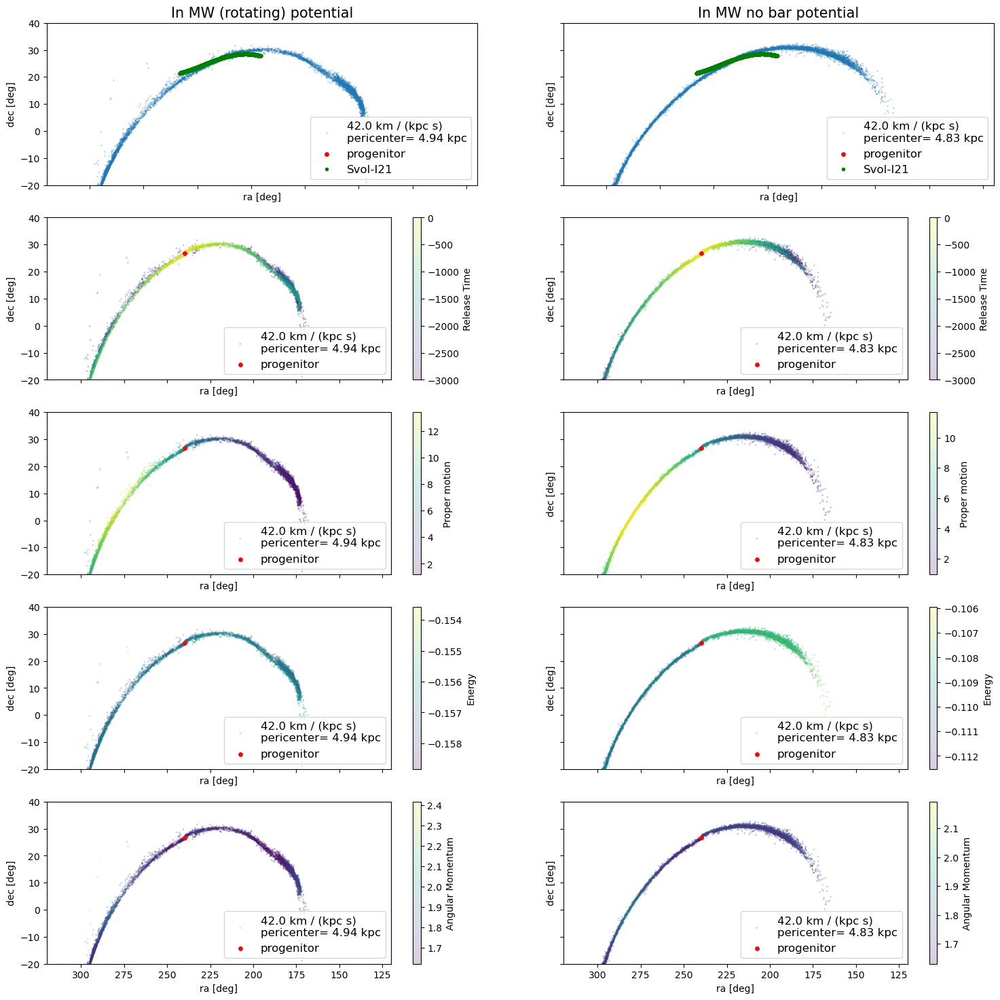

In [48]:
svol_track = mws.get_track_names_for_stream('Svol', On_only=True)[0]
plot_streams(svol_stream_bar, 
             svol_stream_nobar,
             svol_orbit_bar, 
             svol_orbit_nobar,
             svol_track,
             pro_ra=239.80*u.degree,
             pro_dec=26.73*u.degree,
             xlim=(320, 120), 
             ylim=(-20, 40)
            ) 
#plt.scatter(239.80*u.degree, 26.73*u.degree, c='red')

For timestep of 0.1 Myr and nsteps of 50 000 (equivalent of 5 Gyr)

In [39]:
svol_stream_bar2, svol_pro_now_bar2 = generate_stream(svol_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass,step=0.1,nsteps=30000)
svol_stream_nobar2, svol_pro_now_nobar2 = generate_stream(svol_pro, df, no_bar_pot, const_pro_pot,const_pro_mass,step=0.1,nsteps=30000)

In [41]:
svol_w0_bar = gd.PhaseSpacePosition(svol_pro.transform_to(galcen_frame).cartesian)
svol_w0_nobar = gd.PhaseSpacePosition(svol_pro.transform_to(galcen_frame).cartesian)
svol_orbit_bar2 = rot_barred_pot.integrate_orbit(svol_w0_bar, dt=0.1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)
svol_orbit_nobar2 = no_bar_pot.integrate_orbit(svol_w0_nobar, dt=0.1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

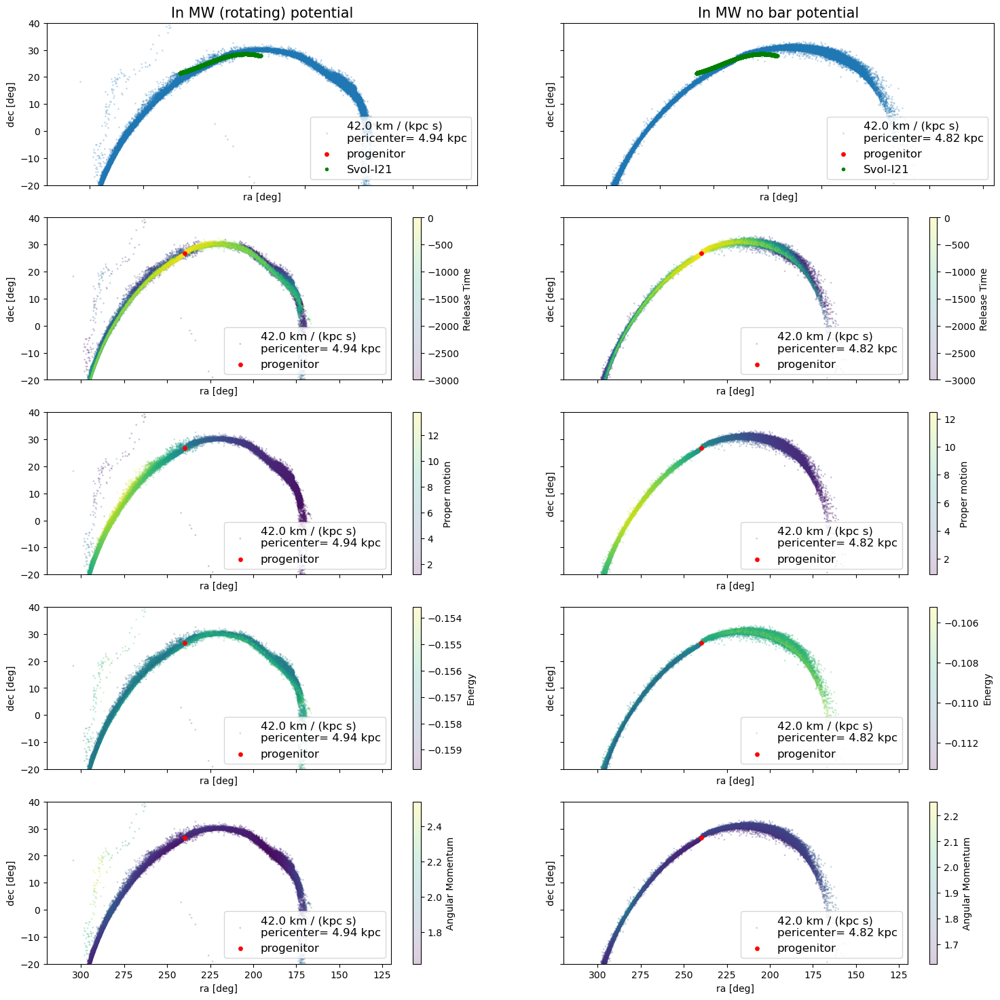

In [43]:
svol_track = mws.get_track_names_for_stream('Svol', On_only=True)[0]
plot_streams(svol_stream_bar2, 
             svol_stream_nobar2,
             svol_orbit_bar2, 
             svol_orbit_nobar2,
             svol_track,
             pro_ra=239.80*u.degree,
             pro_dec=26.73*u.degree,
             xlim=(320, 120), 
             ylim=(-20, 40)
            ) 
#plt.scatter(239.80*u.degree, 26.73*u.degree, c='red')

For timstep of 0.05 Myr and nsteps of 100 000 (equivalent of 5 Gyr)

In [49]:
svol_stream_bar3, svol_pro_now_bar3 = generate_stream(svol_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass,step=0.1,nsteps=10000)
svol_stream_nobar3, _pro_now_nobar3 = generate_stream(svol_pro, df, no_bar_pot, const_pro_pot,const_pro_mass,step=0.1,nsteps=10000)

In [50]:
svol_orbit_bar3 = rot_barred_pot.integrate_orbit(svol_w0_bar, dt=0.05*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)
svol_orbit_nobar3 = no_bar_pot.integrate_orbit(svol_w0_nobar, dt=0.05*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

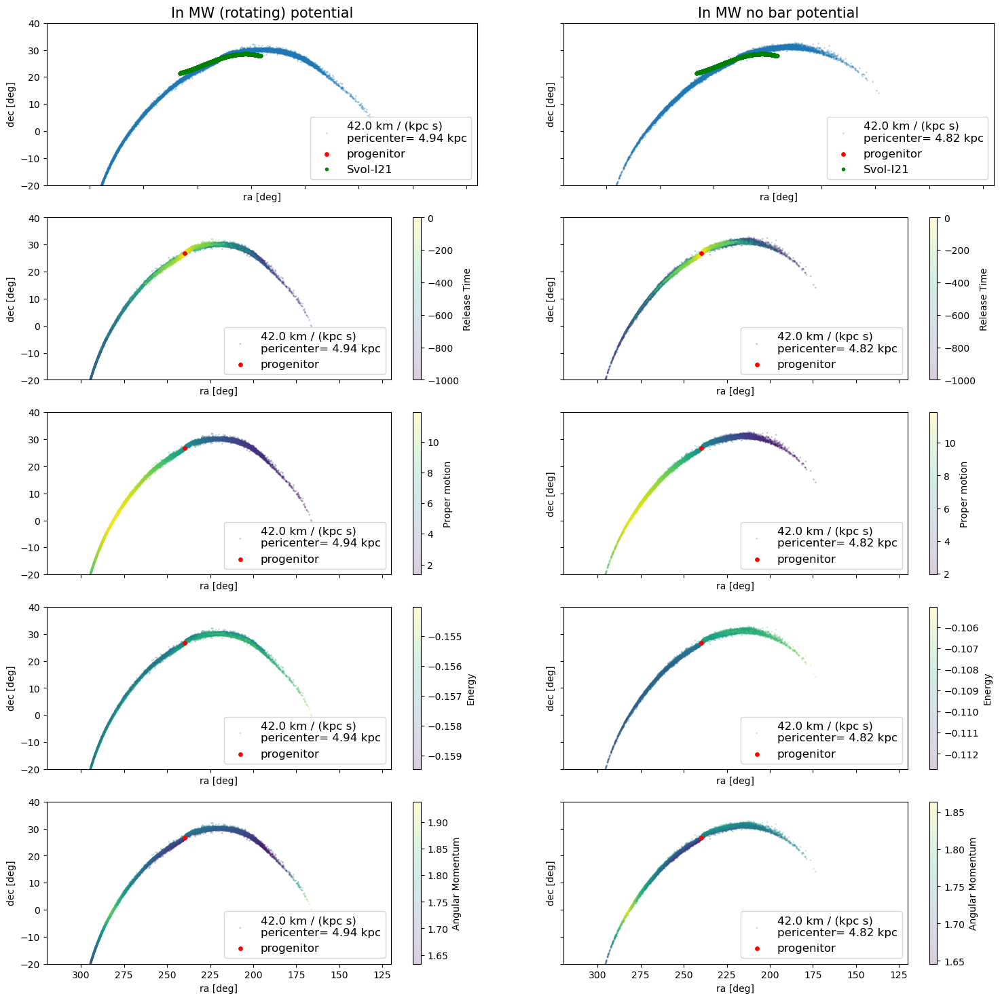

In [51]:
plot_streams(svol_stream_bar3, 
             svol_stream_nobar3,
             svol_orbit_bar3, 
             svol_orbit_nobar3,
             svol_track,
             pro_ra=239.80*u.degree,
             pro_dec=26.73*u.degree,
             xlim=(320, 120), 
             ylim=(-20, 40)
            ) 
#plt.scatter(239.80*u.degree, 26.73*u.degree, c='red')

# For M2 (NGC 7089)

In [25]:
m2_pro = coord.ICRS(ra=323.36*u.degree, dec= -2.35*u.degree, 
                   distance=11.69*u.kpc, 
                   pm_ra_cosdec=3.44 *u.mas/u.yr, 
                   pm_dec=-2.16*u.mas/u.yr, 
                   radial_velocity= -3.72*u.km/u.s) 

For time step of 1 Myr and nsteps of 5000 equivalent of (5 Gyr)

In MW (rotating bar) potential

In [31]:
m2_stream_bar, m2_pro_now_bar = generate_stream(m2_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass,step=1,nsteps=5000)

In [26]:
#integrating the just the orbit
m2_w0_bar = gd.PhaseSpacePosition(m2_pro.transform_to(galcen_frame).cartesian)
m2_orbit_bar = rot_barred_pot.integrate_orbit(m2_w0_bar, dt=1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

In MW (no bar) potential

In [33]:
m2_stream_nobar, _pro_now_nobar = generate_stream(m2_pro, df, no_bar_pot, const_pro_pot,const_pro_mass,step=1,nsteps=5000)

In [27]:
#integrating the just the orbit
m2_w0_nobar = gd.PhaseSpacePosition(m2_pro.transform_to(galcen_frame).cartesian)
m2_orbit_nobar = no_bar_pot.integrate_orbit(m2_w0_nobar, dt=1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

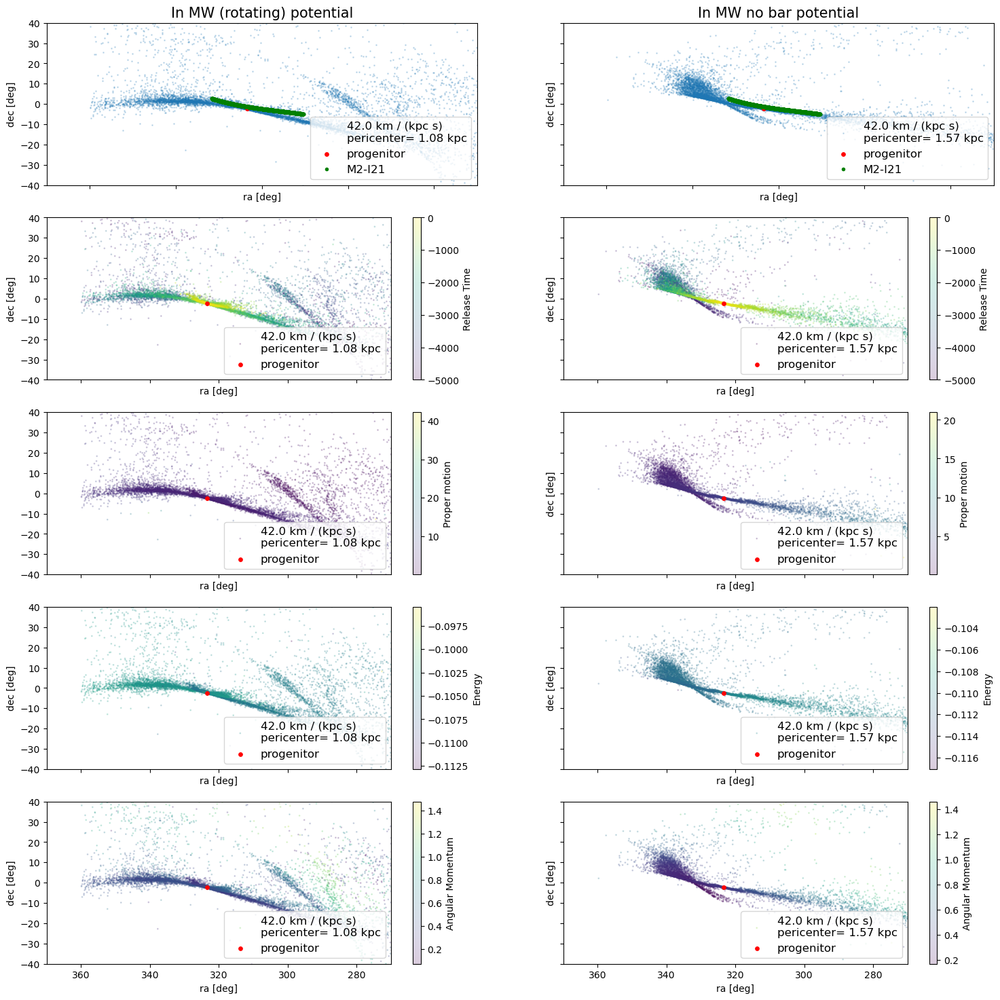

In [35]:
m2_track = mws.get_track_names_for_stream('M2', On_only=True)[0]
plot_streams(m2_stream_bar, 
             m2_stream_nobar,
             m2_orbit_bar, 
             m2_orbit_nobar,
             m2_track,
             pro_ra=323.36*u.degree,
             pro_dec=-2.35*u.degree,
             xlim=(370, 270), 
             ylim=(-40, 40)) 
#plt.scatter(323.36*u.degree, -2.35*u.degree, c='red')

For time step of 0.1 Myr and nsteps of 50 000 equivalent of (5 Gyr)

In [ ]:
m2_stream_bar2, m2_pro_now_bar2 = generate_stream(m2_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass,step=0.1,nsteps=50000)
m2_stream_nobar2, _pro_now_nobar2 = generate_stream(m2_pro, df, no_bar_pot, const_pro_pot,const_pro_mass,step=0.1,nsteps=50000)

In [ ]:
#integrating the just the orbit
m2_orbit_bar2 = rot_barred_pot.integrate_orbit(m2_w0_bar, dt=0.1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)
m2_orbit_nobar2= no_bar_pot.integrate_orbit(m2_w0_nobar, dt=0.1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

In [ ]:
m2_track = mws.get_track_names_for_stream('M2', On_only=True)[0]
plot_streams(m2_stream_bar2, 
             m2_stream_nobar2,
             m2_orbit_bar2, 
             m2_orbit_nobar2,
             m2_track,
             pro_ra=323.36*u.degree,
             pro_dec=-2.35*u.degree,
             xlim=(370, 270), 
             ylim=(-40, 40)) 
#plt.scatter(323.36*u.degree, -2.35*u.degree, c='red')

For time step of 0.05 Myr and nsteps of 100 000 equivalent of (5 Gyr)

In [31]:
m2_stream_bar3, m2_pro_now_bar3 = generate_stream(m2_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass,step=0.05,nsteps=10000)
m2_stream_nobar3, _pro_now_nobar3 = generate_stream(m2_pro, df, no_bar_pot, const_pro_pot,const_pro_mass,step=0.05,nsteps=10000)

In [34]:
#integrating the just the orbit
m2_orbit_bar3 = rot_barred_pot.integrate_orbit(m2_w0_bar, dt=0.05*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)
m2_orbit_nobar3= no_bar_pot.integrate_orbit(m2_w0_nobar, dt=0.05*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

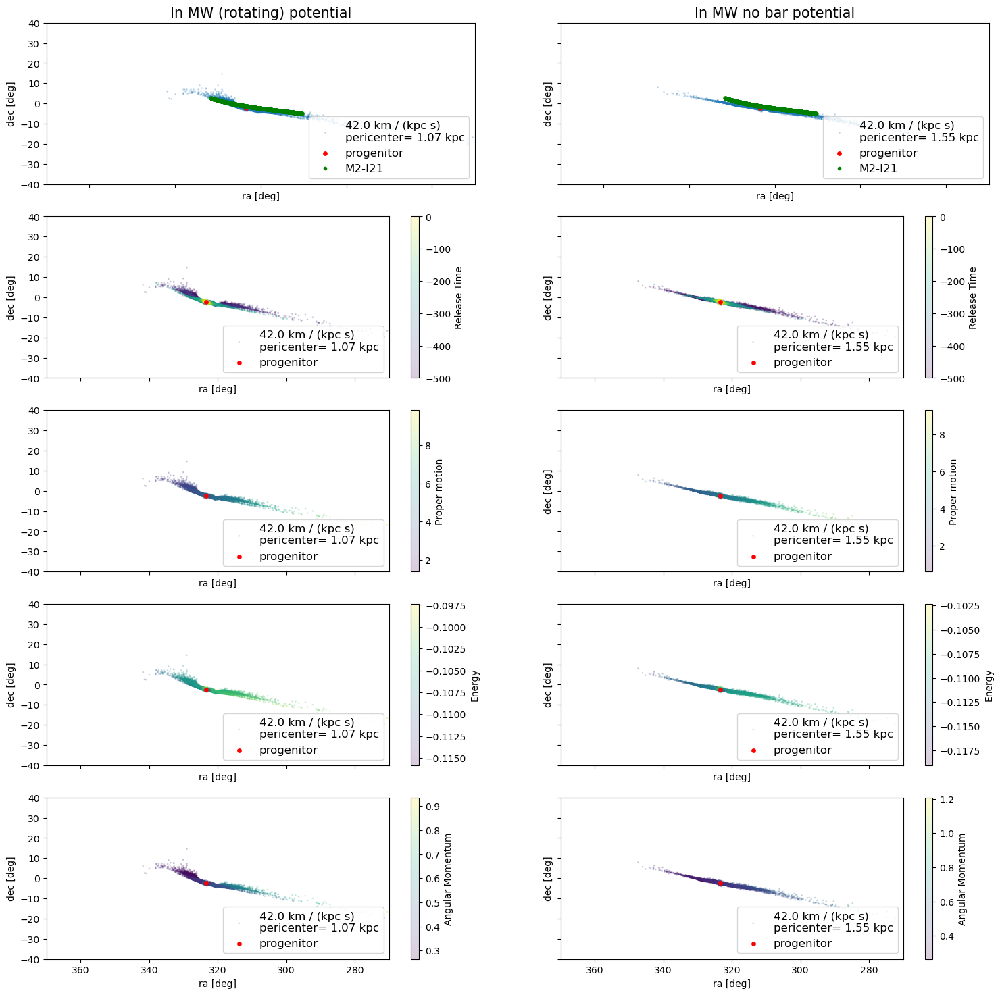

In [35]:
#m2_track = mws.get_track_names_for_stream('M2', On_only=True)[0]
plot_streams(m2_stream_bar3, 
             m2_stream_nobar3,
             m2_orbit_bar3, 
             m2_orbit_nobar3,
             m2_track,
             pro_ra=323.36*u.degree,
             pro_dec=-2.35*u.degree,
             xlim=(370, 270), 
             ylim=(-40, 40)) 
#plt.scatter(323.36*u.degree, -2.35*u.degree, c='red')

# For M92 (NGC6341)

In [36]:
m92_pro = coord.ICRS(ra=259.89*u.degree, dec=43.08 *u.degree, 
                   distance=8.94*u.kpc, 
                   pm_ra_cosdec= -5.15*u.mas/u.yr, 
                   pm_dec=-0.63*u.mas/u.yr, 
                   radial_velocity=-140.66 *u.km/u.s) 

In MW (rotating bar) potential

For time step of 1 Myr and nsteps of 5000 equivalent of (5 Gyr)

In [37]:
m92_stream_bar, m92_pro_now_bar = generate_stream(m92_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass,step=1,nsteps=5000)

In [38]:
#integrating the just the orbit
m92_w0_bar = gd.PhaseSpacePosition(m92_pro.transform_to(galcen_frame).cartesian)
m92_orbit_bar = rot_barred_pot.integrate_orbit(m92_w0_bar, dt=1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

In MW (no bar) potential

In [39]:
m92_stream_nobar, m92_pro_now_nobar = generate_stream(m92_pro, df, no_bar_pot, const_pro_pot,const_pro_mass,step=1,nsteps=5000)

In [40]:
#integrating the just the orbit
m92_w0_nobar = gd.PhaseSpacePosition(m92_pro.transform_to(galcen_frame).cartesian)
m92_orbit_nobar = no_bar_pot.integrate_orbit(m92_w0_nobar, dt=1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

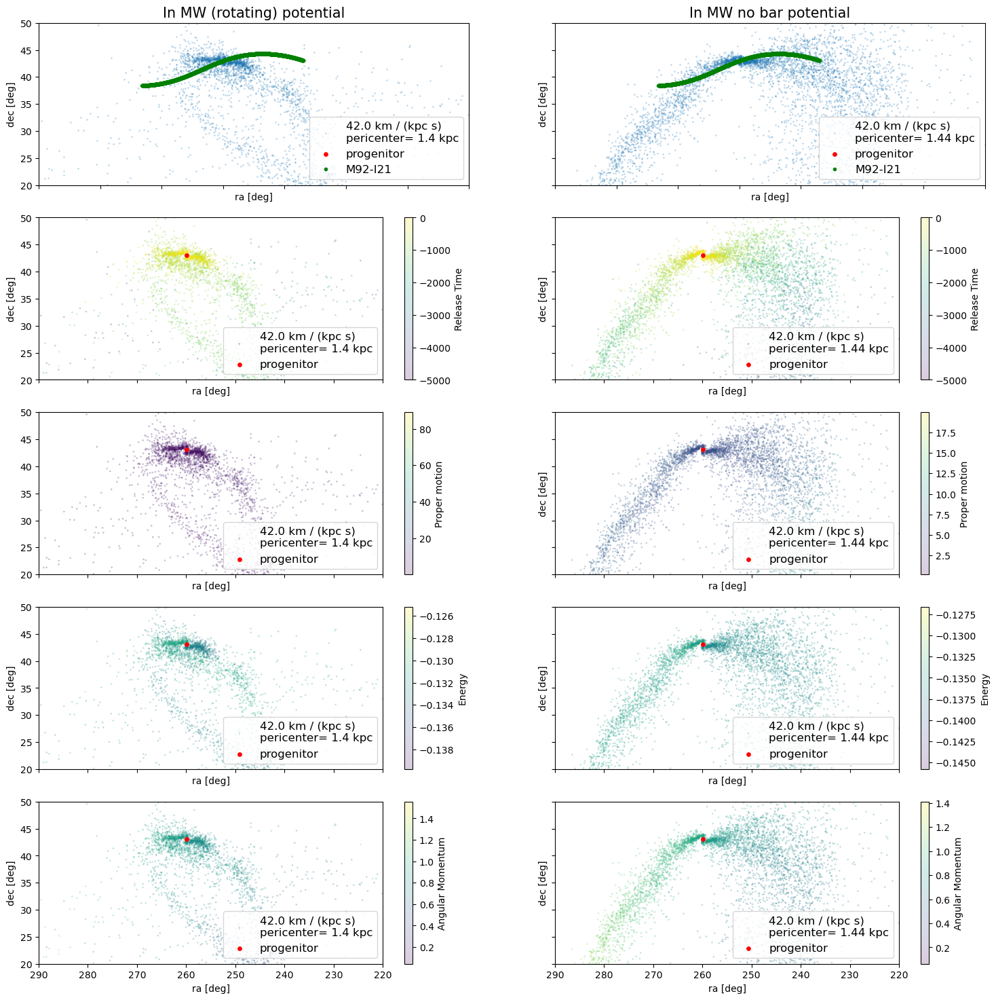

In [41]:
m92_track = mws.get_track_names_for_stream('M92', On_only=True)[0]
plot_streams(m92_stream_bar, 
             m92_stream_nobar,
             m92_orbit_bar, 
             m92_orbit_nobar,
             m92_track,
             pro_ra=259.89*u.degree,
             pro_dec=43.08*u.degree,
             xlim=(290, 220), 
             ylim=(20, 50)) # 
#plt.scatter(259.89*u.degree, 43.08*u.degree, c='red')

For time step of 0.1 Myr and nsteps of 50 000 equivalent of (5 Gyr)

In [ ]:
m92_stream_bar2, m92_pro_now_bar2 = generate_stream(m92_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass,step=0.1,nsteps=10000)
m92_stream_nobar2, m92_pro_now_nobar2 = generate_stream(m92_pro, df, no_bar_pot, const_pro_pot,const_pro_mass,step=0.1,nsteps=10000)


In [ ]:
m92_orbit_bar2 = rot_barred_pot.integrate_orbit(m92_w0_bar, dt=0.1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)
m92_orbit_nobar2 = no_bar_pot.integrate_orbit(m92_w0_nobar, dt=0.1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

In [ ]:
#m92_track = mws.get_track_names_for_stream('M92', On_only=True)[0]
plot_streams(m92_stream_bar2, 
             m92_stream_nobar2,
             m92_orbit_bar2, 
             m92_orbit_nobar2,
             m92_track,
             pro_ra=259.89*u.degree,
             pro_dec=43.08*u.degree,
             xlim=(290, 220), 
             ylim=(20, 50)) # 
#plt.scatter(259.89*u.degree, 43.08*u.degree, c='red')

For time step of 0.05 Myr and nsteps of 100 000 equivalent of (5 Gyr)

In [ ]:
m92_stream_bar3, m92_pro_now_bar3 = generate_stream(m92_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass,step=0.05,nsteps=100000)
m92_stream_nobar3, m92_pro_now_nobar3 = generate_stream(m92_pro, df, no_bar_pot, const_pro_pot,const_pro_mass,step=0.05,nsteps=100000)


In [ ]:
m92_orbit_bar3 = rot_barred_pot.integrate_orbit(m92_w0_bar, dt=0.05*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)
m92_orbit_nobar3 = no_bar_pot.integrate_orbit(m92_w0_nobar, dt=0.05*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

In [ ]:
#m92_track = mws.get_track_names_for_stream('M92', On_only=True)[0]
plot_streams(m92_stream_bar3, 
             m92_stream_nobar3,
             m92_orbit_bar3, 
             m92_orbit_nobar3,
             m92_track,
             pro_ra=259.89*u.degree,
             pro_dec=43.08*u.degree,
             xlim=(290, 220), 
             ylim=(20, 50)) # 
#plt.scatter(259.89*u.degree, 43.08*u.degree, c='red')

# For Omega Centauri (NGC 5139)- note this is retrograde

In [94]:
#Ibata et al. 2019 integrated for 5GYR
omegacen_pro = coord.ICRS(ra=201.70*u.degree, dec= -47.48*u.degree, 
                   distance=5.20*u.kpc, 
                   pm_ra_cosdec=-3.22 *u.mas/u.yr, 
                   pm_dec=-6.76*u.mas/u.yr, 
                   radial_velocity=232.7 *u.km/u.s) 

In MW (rotating bar) potential

In [95]:
omegacen_stream_bar, omegacen_pro_now_bar = generate_stream(omegacen_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass)

In [96]:
#integrating the just the orbit
omegacen_w0_bar = gd.PhaseSpacePosition(omegacen_pro.transform_to(galcen_frame).cartesian)
omegacen_orbit_bar = rot_barred_pot.integrate_orbit(omegacen_w0_bar, dt=0.1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

In MW (no bar) potential

In [97]:
omegacen_stream_nobar, omegacen_pro_now_nobar = generate_stream(omegacen_pro, df, no_bar_pot, const_pro_pot,const_pro_mass)

In [98]:
#integrating the just the orbit
omegacen_w0_nobar = gd.PhaseSpacePosition(omegacen_pro.transform_to(galcen_frame).cartesian)
omegacen_orbit_nobar = no_bar_pot.integrate_orbit(omegacen_w0_nobar, dt=0.1*u.Myr, t1=0, t2=t_orbit).to_frame(static_frame)

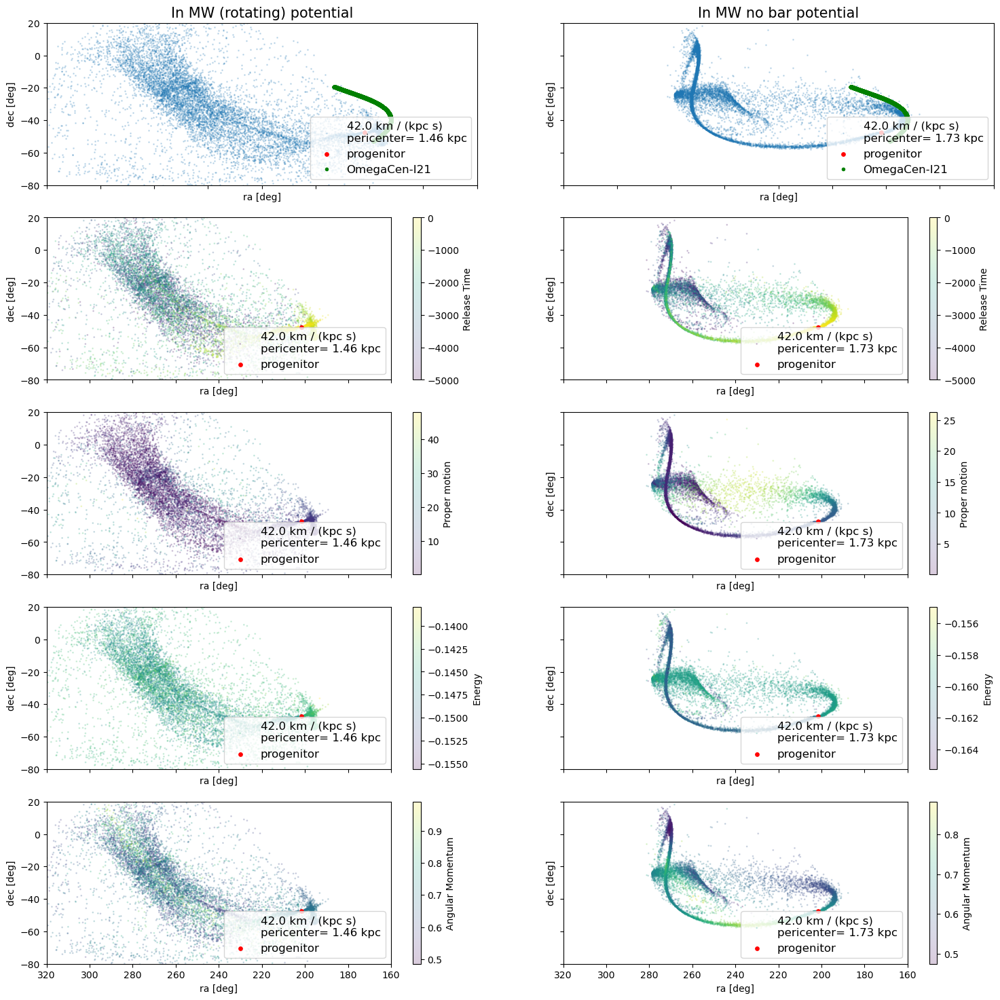

In [206]:
omegacen_track = mws.get_track_names_for_stream('Omega', On_only=True)[0]
plot_streams(omegacen_stream_bar, 
             omegacen_stream_nobar,
             omegacen_orbit_bar, 
             omegacen_orbit_nobar,
             omegacen_track,
             pro_ra=201.697*u.degree,
             pro_dec=-47.48*u.degree,
             xlim=(320, 160), 
             ylim=(-80, 20)
            ) 
#plt.scatter(201.697*u.degree, -47.48*u.degree, c='red')

Text(0.5, 0.92, 'Orbits of 7 chosen streams using a constant progenitor mass and integration time')

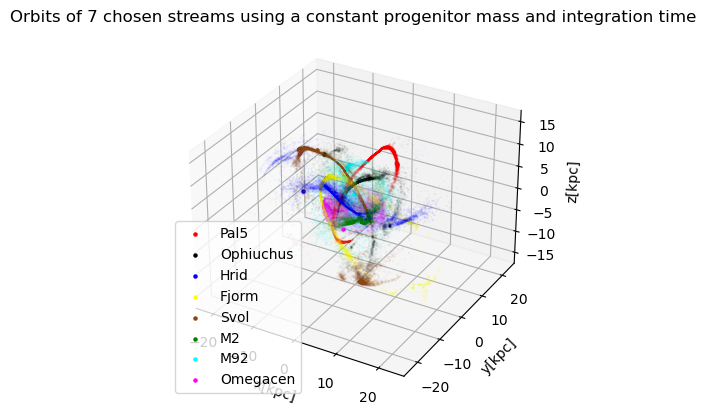

In [207]:
#plotting stream in 3d
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

ax.scatter(pal5_stream_bar.x.value[0], pal5_stream_bar.y.value[0], pal5_stream_bar.z.value[0], c='red', label='Pal5', s=5)
ax.scatter(pal5_stream_bar.x.value, pal5_stream_bar.y.value, pal5_stream_bar.z.value, c='red', s=0.001)

ax.scatter(ophiuchus_stream_bar.x.value[0], ophiuchus_stream_bar.y.value[0], ophiuchus_stream_bar.z.value[0], c='black', label='Ophiuchus', s=5)
ax.scatter(ophiuchus_stream_bar.x.value, ophiuchus_stream_bar.y.value, ophiuchus_stream_bar.z.value, c='black', s=0.001)

ax.scatter(hrid_stream_bar.x.value[0], hrid_stream_bar.y.value[0], hrid_stream_bar.z.value[0], c='blue', label='Hrid', s=5)
ax.scatter(hrid_stream_bar.x.value, hrid_stream_bar.y.value, hrid_stream_bar.z.value, c='blue', s=0.001)

ax.scatter(fjorm_stream_bar.x.value[0], fjorm_stream_bar.y.value[0], fjorm_stream_bar.z.value[0], c='yellow', label='Fjorm', s=5)
ax.scatter(fjorm_stream_bar.x.value, fjorm_stream_bar.y.value, fjorm_stream_bar.z.value, c='yellow', s=0.001)

ax.scatter(svol_stream_bar.x.value[0], svol_stream_bar.y.value[0], svol_stream_bar.z.value[0], c='saddlebrown', label='Svol', s=5)
ax.scatter(svol_stream_bar.x.value, svol_stream_bar.y.value, svol_stream_bar.z.value, c='saddlebrown', s=0.001)

ax.scatter(m2_stream_bar.x.value[0], m2_stream_bar.y.value[0], m2_stream_bar.z.value[0], c='green', label='M2', s=5)
ax.scatter(m2_stream_bar.x.value, m2_stream_bar.y.value, m2_stream_bar.z.value, c='green', s=0.001)

ax.scatter(m92_stream_bar.x.value[0], m92_stream_bar.y.value[0], m92_stream_bar.z.value[0], c='cyan', label='M92', s=5)
ax.scatter(m92_stream_bar.x.value, m92_stream_bar.y.value, m92_stream_bar.z.value, c='cyan', s=0.001)

ax.scatter(omegacen_stream_bar.x.value[0], omegacen_stream_bar.y.value[0], omegacen_stream_bar.z.value[0], c='magenta', label='Omegacen', s=5)
ax.scatter(omegacen_stream_bar.x.value, omegacen_stream_bar.y.value, omegacen_stream_bar.z.value, c='magenta', s=0.001)

ax.legend()
ax.set_xlabel('x[kpc]')
ax.set_ylabel('y[kpc]')
ax.set_zlabel('z[kpc]')
ax.set_title('Orbits of 7 chosen streams using a constant progenitor mass and integration time')

# Investigating Orbits & Jacobi Energy Conservation

Text(0.5, 0.98, "with Omega Centauri's Phasespace position in a MW (no bar) potential")

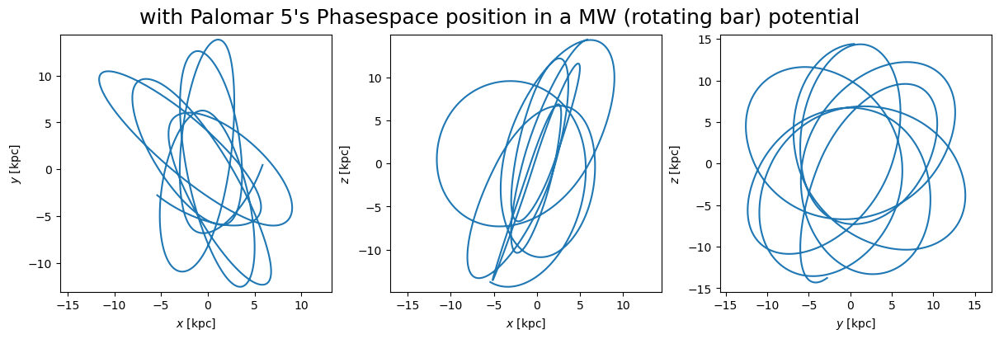

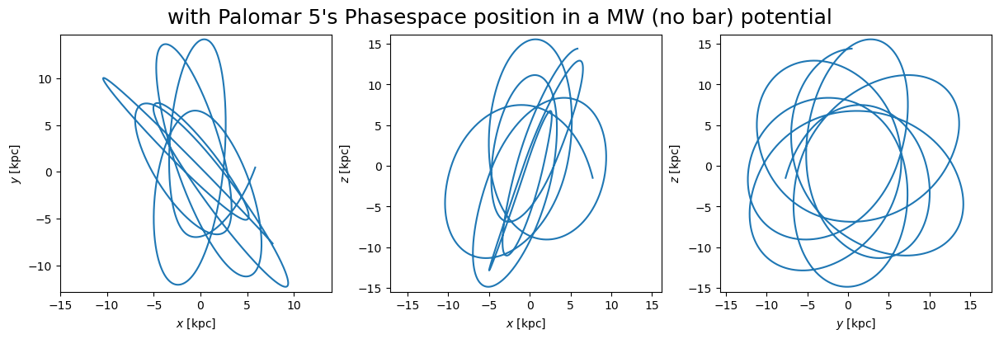

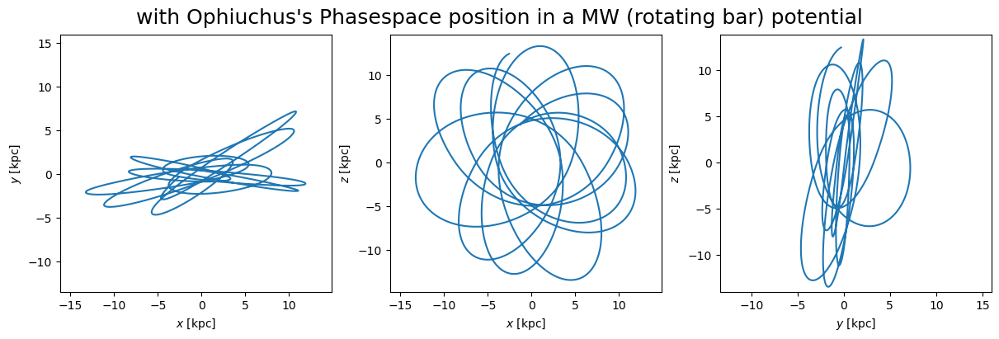

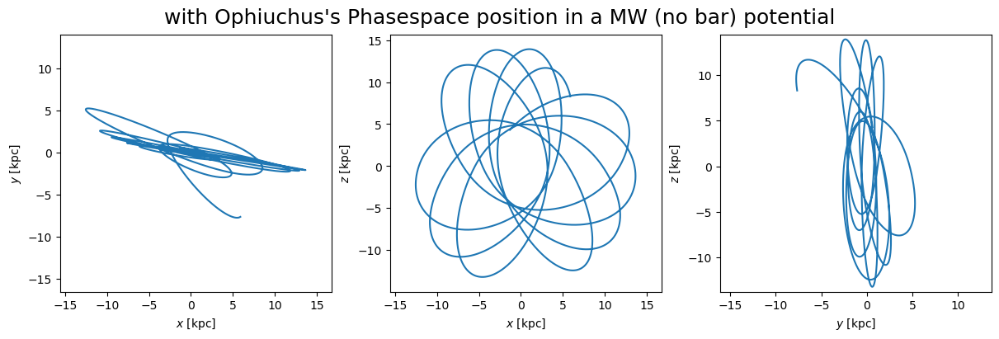

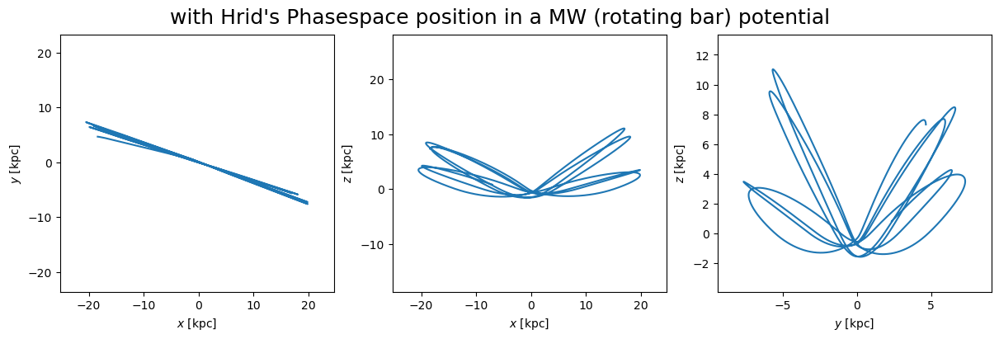

...

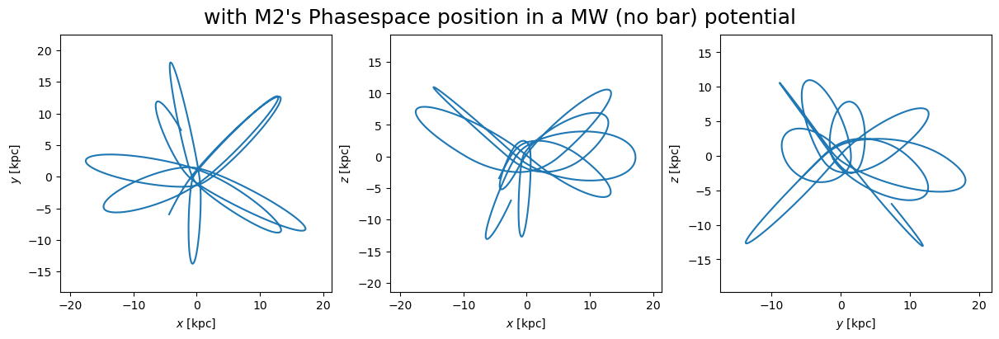

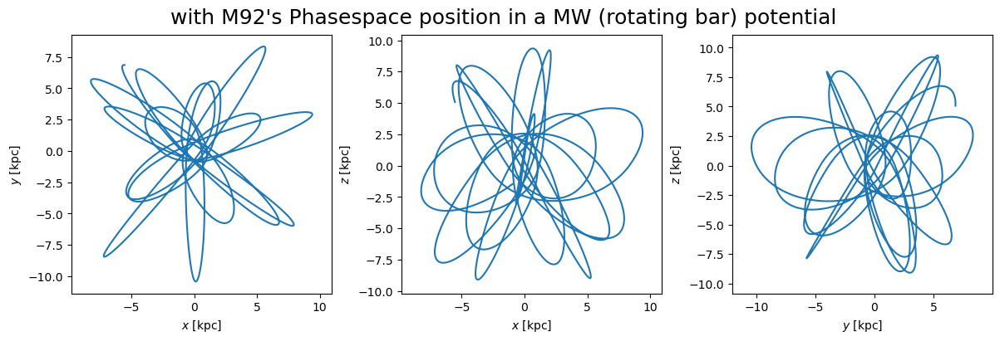

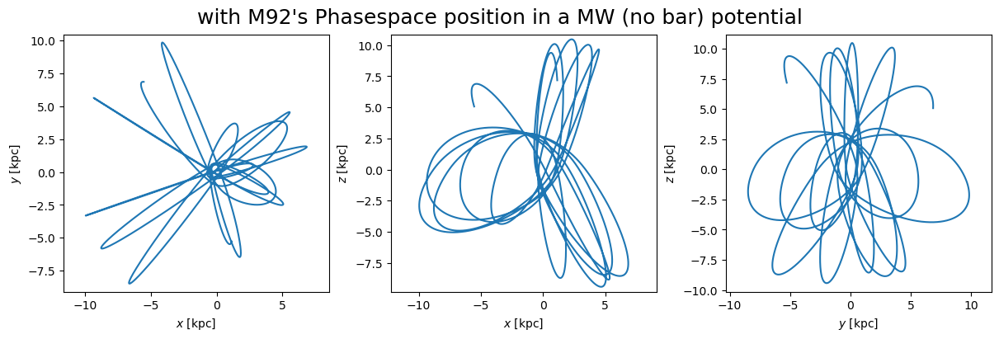

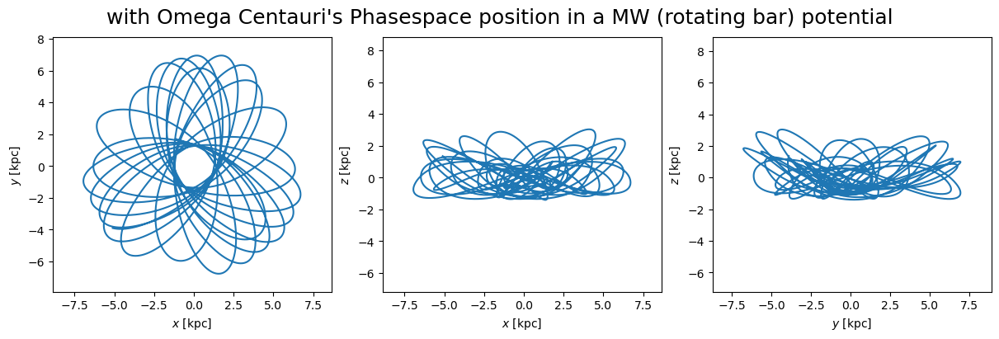

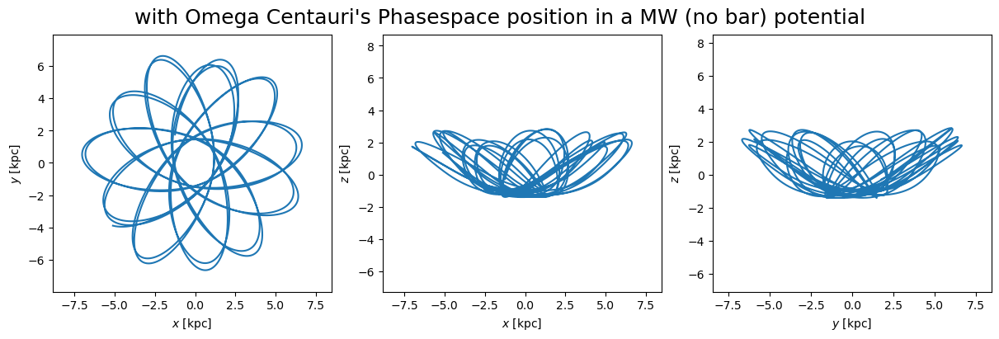

In [208]:
fig = pal5_orbit_bar.plot();
fig.suptitle("with Palomar 5's Phasespace position in a MW (rotating bar) potential", fontsize=18)
fig = pal5_orbit_nobar.plot();
fig.suptitle("with Palomar 5's Phasespace position in a MW (no bar) potential", fontsize=18)

fig = ophiuchus_orbit_bar.plot();
fig.suptitle("with Ophiuchus's Phasespace position in a MW (rotating bar) potential", fontsize=18)
fig = ophiuchus_orbit_nobar.plot();
fig.suptitle("with Ophiuchus's Phasespace position in a MW (no bar) potential", fontsize=18)


fig = hrid_orbit_bar.plot();
fig.suptitle("with Hrid's Phasespace position in a MW (rotating bar) potential", fontsize=18)
fig = hrid_orbit_nobar.plot();
fig.suptitle("with Hrid's Phasespace position in a MW (no bar) potential", fontsize=18)

fig = fjorm_orbit_bar.plot();
fig.suptitle("with Fjorm's Phasespace position in a MW (rotating bar) potential", fontsize=18)
fig = fjorm_orbit_nobar.plot();
fig.suptitle("with Fjorm's Phasespace position in a MW (no bar) potential", fontsize=18)

fig = svol_orbit_bar.plot();
fig.suptitle("with Svol's Phasespace position in a MW (rotating bar) potential", fontsize=18)
fig = svol_orbit_nobar.plot();
fig.suptitle("with Svol's Phasespace position in a MW (no bar) potential", fontsize=18)

fig = m2_orbit_bar.plot();
fig.suptitle("with M2's Phasespace position in a MW (rotating bar) potential", fontsize=18)
fig = m2_orbit_nobar.plot();
fig.suptitle("with M2's Phasespace position in a MW (no bar) potential", fontsize=18)

fig = m92_orbit_bar.plot();
fig.suptitle("with M92's Phasespace position in a MW (rotating bar) potential", fontsize=18)
fig = m92_orbit_nobar.plot();
fig.suptitle("with M92's Phasespace position in a MW (no bar) potential", fontsize=18)

fig = omegacen_orbit_bar.plot();
fig.suptitle("with Omega Centauri's Phasespace position in a MW (rotating bar) potential", fontsize=18)
fig = omegacen_orbit_nobar.plot();
fig.suptitle("with Omega Centauri's Phasespace position in a MW (no bar) potential", fontsize=18)


In [209]:
# #goal: plot change in jacobi energy
# omega = pat_speed * [0,0,-1]

# E = ophiuchus_orbit_bar.energy()
# delta_E = E[:] - E[0]

# L = ophiuchus_orbit_bar.angular_momentum()
# Lx, Ly, Lz = ophiuchus_orbit_bar.angular_momentum()

# #L_net = np.sqrt(Lx**2 + Ly**2 + Lz**2 ) 
# omega_z = -1 #

# delta_L = L[:,:] - L[:,0:1]
# delta_jacobi = delta_E - np.dot(omega, delta_L)

# jacobi = E - (omega[-1] * Lz)
# fractional_delta_jacobi = delta_jacobi / jacobi

# plt.plot(delta_jacobi)


In [219]:
#displaying orbit apocenters

# print(f"apocenter for pal5 orbit in barred potential = {np.round(pal5_orbit_bar.apocenter(),2)}\n")
# print(f"apocenter for pal5 orbit in no bar potential = {np.round(pal5_orbit_nobar.apocenter(),2)}\n")

# print(f"apocenter for ophiuchus orbit in barred potential = {np.round(ophiuchus_orbit_bar.apocenter(),2)}\n")
# print(f"apocenter for ophiuchus orbit in no bar potential = {np.round(ophiuchus_orbit_nobar.apocenter(),2)}\n")

# print(f"apocenter for hrid orbit in barred potential = {np.round(hrid_orbit_bar.apocenter(),2)}\n")
# print(f"apocenter for hrid orbit in no bar potential = {np.round(hrid_orbit_nobar.apocenter(),2)}\n")

# print(f"apocenter for fjorm orbit in barred potential = {np.round(fjorm_orbit_bar.apocenter(),2)}\n")
# print(f"apocenter for fjorm orbit in no bar potential = {np.round(fjorm_orbit_nobar.apocenter(),2)}\n")

# print(f"apocenter for svol orbit in barred potential = {np.round(svol_orbit_bar.apocenter(),2)}\n")
# print(f"apocenter for svol orbit in no bar potential = {np.round(svol_orbit_nobar.apocenter(),2)}\n")

# print(f"apocenter for M2 orbit in barred potential = {np.round(m2_orbit_bar.apocenter(),2)}\n")
# print(f"apocenter for M2 orbit in no bar potential = {np.round(m2_orbit_nobar.apocenter(),2)}\n")

# print(f"apocenter for M92 orbit in barred potential = {np.round(m92_orbit_bar.apocenter(),2)}\n")
# print(f"apocenter for M92 orbit in no bar potential = {np.round(m92_orbit_nobar.apocenter(),2)}\n")

# print(f"apocenter for omegacen orbit in barred potential = {np.round(omegacen_orbit_bar.apocenter(),2)}\n")
# print(f"apocenter for omegacen orbit in no bar potential = {np.round(omegacen_orbit_nobar.apocenter(),2)}\n")

# Studying Density Fluctuations

In [220]:
def rotate_stream(stream_bar, stream_nobar, pro_now_bar,name):
    new_x = pro_now_bar.xyz[:, 0]
    new_y = (
        np.median(stream_nobar[stream_nobar.lead_trail == 'l'].xyz, axis=1) - 
        np.median(stream_nobar[stream_nobar.lead_trail == 't'].xyz, axis=1)
    )
    new_y = new_y - (new_x @ new_y) / (new_x @ new_x) * new_x

    xhat = new_x / np.linalg.norm(new_x)
    yhat = new_y / np.linalg.norm(new_y)
    zhat = np.cross(xhat, yhat)
    R = np.stack((xhat, yhat, zhat))

    stream_rot_bar = gd.PhaseSpacePosition(stream_bar.data.transform(R))
    stream_rot_nobar = gd.PhaseSpacePosition(stream_nobar.data.transform(R))


    # Setting up density plots

    data_bar = stream_rot_bar.spherical.lon.wrap_at(180*u.deg).degree
    data_nobar = stream_rot_nobar.spherical.lon.wrap_at(180*u.deg).degree

    # Compute histogram
    counts_bar, bins_bar = np.histogram(data_bar, bins=200)
    counts_nobar, bins_nobar = np.histogram(data_nobar, bins=200)

    # Normalize frequencies
    normalized_counts_bar = counts_bar / np.max(counts_bar)
    normalized_counts_nobar = counts_nobar / np.max(counts_nobar)
    
    fig, axes = plt.subplots(
    2, 2, 
    figsize=(15, 5), 
    sharex = True,
    constrained_layout=True
    )

    opts = dict(
        bins=(
            np.linspace(-40, 40, 256),
            np.linspace(-8, 8, 128)
        ),
        norm=mpl.colors.LogNorm(vmin=0.5, vmax=10),
        cmap='Greys',
        alpha=0.8
    )
    #Bar
    axes[0,0].hist2d( 
        stream_rot_nobar.spherical.lon.wrap_at(180*u.deg).degree,
        stream_rot_nobar.spherical.lat.degree,
        **opts
    ); # 2d hist plot in no bar
    axes[1,0].bar(bins_nobar[:-1], normalized_counts_nobar, width=np.diff(bins_nobar), align='edge', color='gray') # 1d hist plot

    #No Bar    
    axes[0,1].hist2d(
        stream_rot_bar.spherical.lon.wrap_at(180*u.deg).degree,
        stream_rot_bar.spherical.lat.degree,
        **opts
    ); #2d hist plot in bar
    axes[1,1].bar(bins_bar[:-1], normalized_counts_bar, width=np.diff(bins_bar), align='edge', color='gray') #1d hist plot
    
    plt.suptitle(name, fontsize=15)

    axes[1,-1].set_xlabel(r'$\phi_1$')
    axes[0,0].set_title('No bar')
    axes[1,0].set_title('No bar')
    axes[0,1].set_title('Bar')
    axes[1,1].set_title('Bar')
    
    axes[1,0].set_xlabel(r'$\phi_1$')
    axes[1,1].set_xlabel(r'$\phi_1$')
    axes[0,0].set_ylabel(r'$\phi_2$') 
    axes[1,0].set_ylabel("Density")

    plt.show()

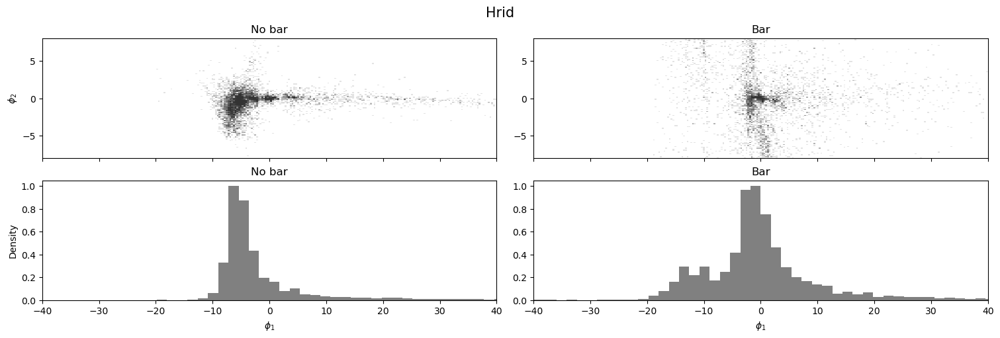

In [221]:
rotate_stream(hrid_stream_bar, hrid_stream_nobar, hrid_pro_now_bar, "Hrid")

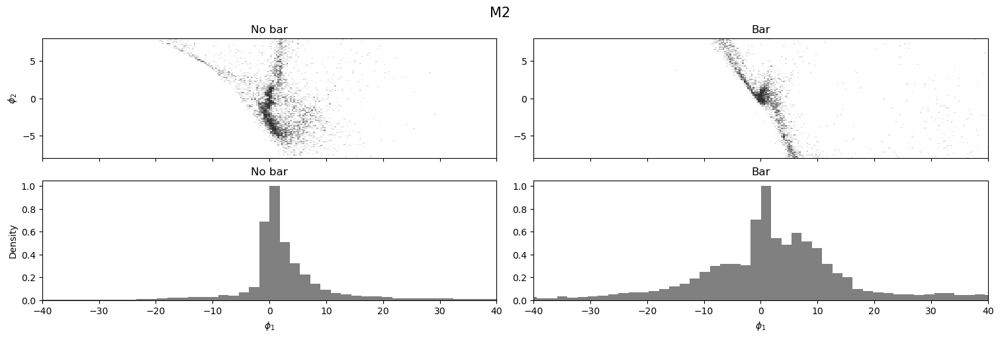

In [222]:
rotate_stream(m2_stream_bar, m2_stream_nobar, m2_pro_now_bar, "M2")

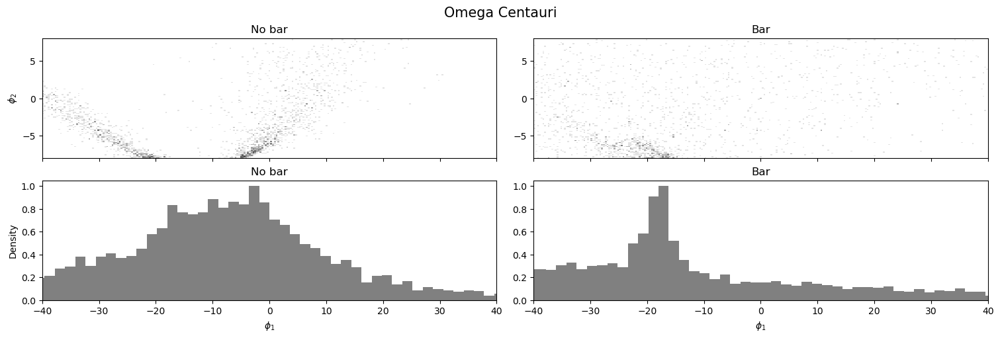

In [223]:
rotate_stream(omegacen_stream_bar, omegacen_stream_nobar, omegacen_pro_now_bar, "Omega Centauri")

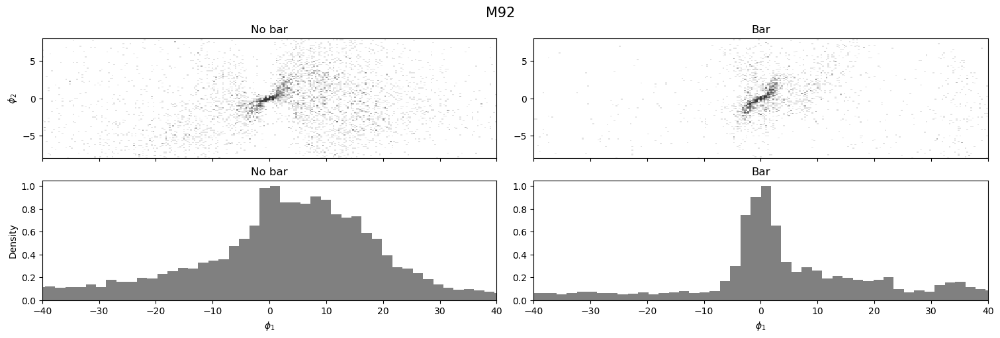

In [224]:
rotate_stream(m92_stream_bar, m92_stream_nobar, m92_pro_now_bar, "M92")

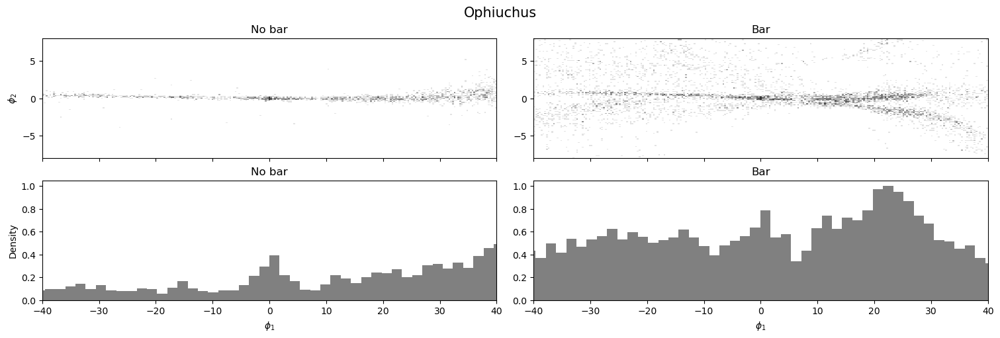

In [225]:
rotate_stream(ophiuchus_stream_bar, ophiuchus_stream_nobar, ophiuchus_pro_now_bar, "Ophiuchus")

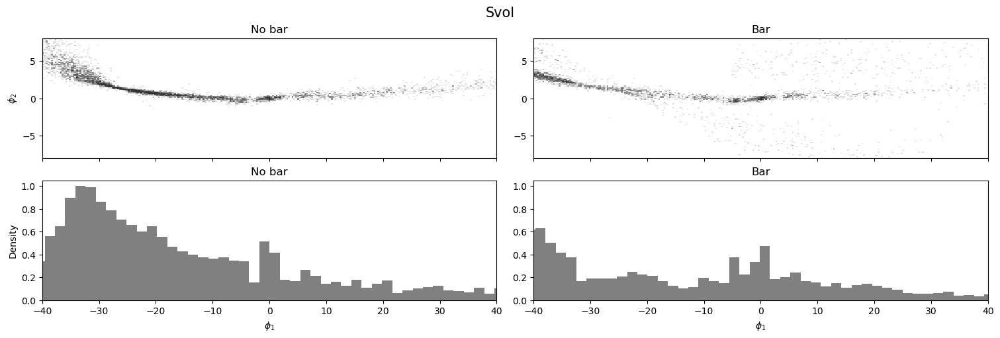

In [226]:
rotate_stream(svol_stream_bar, svol_stream_nobar, svol_pro_now_bar, "Svol")

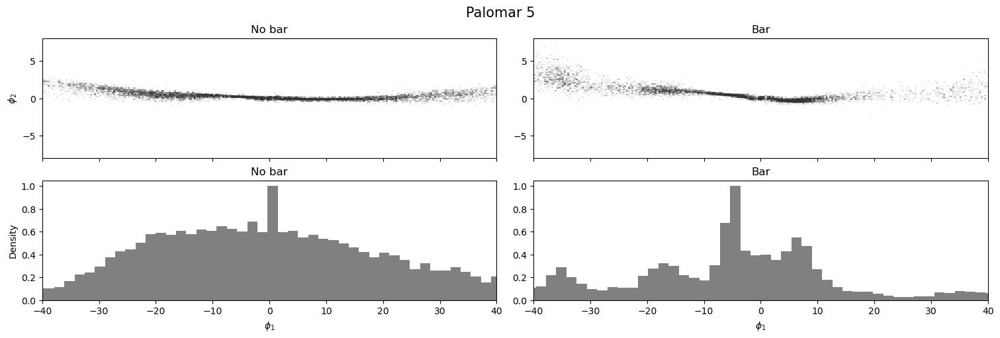

In [227]:
rotate_stream(pal5_stream_bar, pal5_stream_nobar, pal5_pro_now_bar, "Palomar 5")

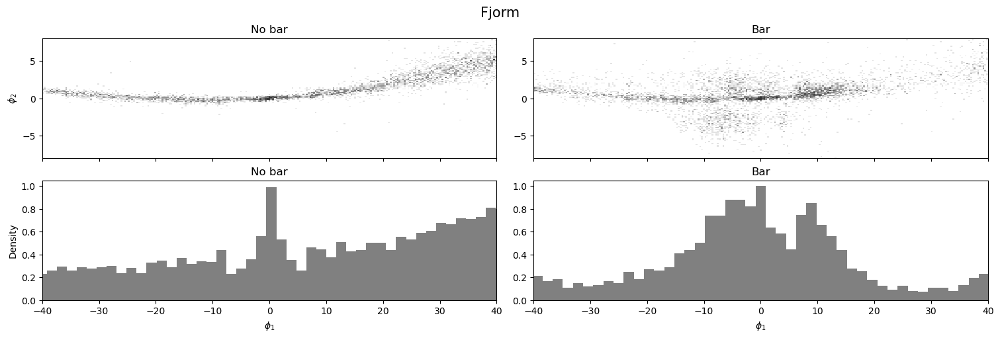

In [228]:
rotate_stream(fjorm_stream_bar, fjorm_stream_nobar, fjorm_pro_now_bar, "Fjorm")

# Studying streams with pericenters from  9 kpc  to  21 kpc 

 Setting Initial Conditions

In [229]:
c19_pro = coord.ICRS(ra=355.28*u.degree, dec= 28.82*u.degree, #malhan et al. 2022 
                   distance=18.04*u.kpc, #malhan et al. 2022 
                   pm_ra_cosdec= 1.25*u.mas/u.yr, #malhan et al. 2022
                   pm_dec=-2.74*u.mas/u.yr, #malhan et al. 2022
                   radial_velocity= -193.48*u.km/u.s) #malhan et al. 2022

In [230]:
aliqauma_pro = coord.ICRS(ra=34.08*u.degree, dec= -33.97*u.degree, #malhan et al. 2022 
                   distance=21.48*u.kpc, #malhan et al. 2022 
                   pm_ra_cosdec= 0.24*u.mas/u.yr, #malhan et al. 2022
                   pm_dec=-0.79*u.mas/u.yr, #malhan et al. 2022
                   radial_velocity=-42.33 *u.km/u.s) #malhan et al. 2022

In [231]:
atlas_pro = coord.ICRS(ra=25.04*u.degree, dec= -29.81*u.degree, #malhan et al. 2022 
                   distance=19.93*u.kpc, #malhan et al. 2022 
                   pm_ra_cosdec= 0.04*u.mas/u.yr, #malhan et al. 2022
                   pm_dec=-0.89*u.mas/u.yr, #malhan et al. 2022
                   radial_velocity= -85.65*u.km/u.s) #malhan et al. 2022

In [232]:
indus_pro = coord.ICRS(ra=340.12*u.degree, dec= -60.58*u.degree, #malhan et al. 2022 
                   distance=14.96*u.kpc, #malhan et al. 2022 
                   pm_ra_cosdec= 3.59*u.mas/u.yr, #malhan et al. 2022
                   pm_dec=-4.89*u.mas/u.yr, #malhan et al. 2022
                   radial_velocity= -49.15*u.km/u.s) #malhan et al. 2022

In [233]:
kshir_pro = coord.ICRS(ra=205.88*u.degree, dec= 67.25*u.degree, #malhan et al. 2022 
                   distance=9.57*u.kpc, #malhan et al. 2022 
                   pm_ra_cosdec= -7.67*u.mas/u.yr, #malhan et al. 2022
                   pm_dec=-3.92*u.mas/u.yr, #malhan et al. 2022
                   radial_velocity= -249.88*u.km/u.s) #malhan et al. 2022

In [234]:
gd1_pro = coord.ICRS(ra=160.02*u.degree, dec= 45.9*u.degree, #malhan et al. 2022 
                   distance=8.06*u.kpc, #malhan et al. 2022 
                   pm_ra_cosdec= -6.75*u.mas/u.yr, #malhan et al. 2022
                   pm_dec=-10.88*u.mas/u.yr, #malhan et al. 2022
                   radial_velocity= -101.83*u.km/u.s) #malhan et al. 2022

In [235]:
c20_pro = coord.ICRS(ra=359.81*u.degree, dec= 8.63*u.degree, #malhan et al. 2022 
                   distance=18.11*u.kpc, #malhan et al. 2022 
                   pm_ra_cosdec= -0.58*u.mas/u.yr, #malhan et al. 2022
                   pm_dec=1.44*u.mas/u.yr, #malhan et al. 2022
                   radial_velocity= -116.87*u.km/u.s) #malhan et al. 2022

Generating the streams

In [236]:
#creating new lists
streams_bar = []
streams_nobar = []
pros_now_bar = []
pros_now_nobar = []
names = ["C-19", "Aliqa-Uma", "Atlas", "Indus", "Kshir", "GD-1", "C-20"] # the order of this list is important

In [237]:
# C-19: creating streams in barred and no bar MW potential
c19_stream_bar, c19_pro_now_bar = generate_stream(c19_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass)
c19_stream_nobar, c19_pro_now_nobar = generate_stream(c19_pro, df, no_bar_pot, const_pro_pot,const_pro_mass)

#appending streams and progenitor to appropriate lists
streams_bar.append(c19_stream_bar)
streams_nobar.append(c19_stream_nobar)
pros_now_bar.append(c19_pro_now_bar)
pros_now_nobar.append(c19_pro_now_nobar)

In [238]:
# Aliqa-Uma: creating streams in barred and no bar MW potential
aliqauma_stream_bar, aliqauma_pro_now_bar = generate_stream(aliqauma_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass)
aliqauma_stream_nobar, aliqauma_pro_now_nobar = generate_stream(aliqauma_pro, df, no_bar_pot, const_pro_pot,const_pro_mass)

#appending streams and progenitor to appropriate lists
streams_bar.append(aliqauma_stream_bar)
streams_nobar.append(aliqauma_stream_nobar)
pros_now_bar.append(aliqauma_pro_now_bar)
pros_now_nobar.append(aliqauma_pro_now_nobar)

In [239]:
# Atlas: creating streams in barred and no bar MW potential
atlas_stream_bar, atlas_pro_now_bar = generate_stream(atlas_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass)
atlas_stream_nobar, atlas_pro_now_nobar = generate_stream(atlas_pro, df, no_bar_pot, const_pro_pot,const_pro_mass)

#appending streams and progenitor to appropriate lists
streams_bar.append(atlas_stream_bar)
streams_nobar.append(atlas_stream_nobar)
pros_now_bar.append(atlas_pro_now_bar)
pros_now_nobar.append(atlas_pro_now_nobar)

In [240]:
# Indus: creating streams in barred and no bar MW potential
indus_stream_bar, indus_pro_now_bar = generate_stream(indus_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass)
indus_stream_nobar, indus_pro_now_nobar = generate_stream(indus_pro, df, no_bar_pot, const_pro_pot,const_pro_mass)

#appending streams and progenitor to appropriate lists
streams_bar.append(indus_stream_bar)
streams_nobar.append(indus_stream_nobar)
pros_now_bar.append(indus_pro_now_bar)
pros_now_nobar.append(indus_pro_now_nobar)

In [241]:
# Kshir: creating streams in barred and no bar MW potential
kshir_stream_bar, kshir_pro_now_bar = generate_stream(kshir_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass)
kshir_stream_nobar, kshir_pro_now_nobar = generate_stream(kshir_pro, df, no_bar_pot, const_pro_pot,const_pro_mass)

#appending streams and progenitor to appropriate lists
streams_bar.append(kshir_stream_bar)
streams_nobar.append(kshir_stream_nobar)
pros_now_bar.append(kshir_pro_now_bar)
pros_now_nobar.append(kshir_pro_now_nobar)

In [242]:
# GD-1: creating streams in barred and no bar MW potential
gd1_stream_bar, gd1_pro_now_bar = generate_stream(gd1_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass)
gd1_stream_nobar, gd1_pro_now_nobar = generate_stream(gd1_pro, df, no_bar_pot, const_pro_pot,const_pro_mass)

#appending streams and progenitor to appropriate lists
streams_bar.append(gd1_stream_bar)
streams_nobar.append(gd1_stream_nobar)
pros_now_bar.append(gd1_pro_now_bar)
pros_now_nobar.append(gd1_pro_now_nobar)

In [243]:
# C-20: creating streams in barred and no bar MW potential
c20_stream_bar, c20_pro_now_bar = generate_stream(c20_pro, df, rot_barred_pot, const_pro_pot,const_pro_mass)
c20_stream_nobar, c20_pro_now_nobar = generate_stream(c20_pro, df, no_bar_pot, const_pro_pot,const_pro_mass)

#appending streams and progenitor to appropriate lists
streams_bar.append(c20_stream_bar)
streams_nobar.append(c20_stream_nobar)
pros_now_bar.append(c20_pro_now_bar)
pros_now_nobar.append(c20_pro_now_nobar)

Displaying plots

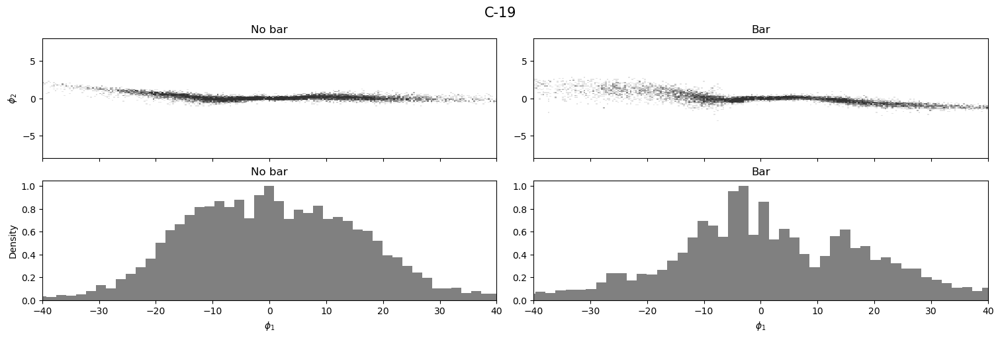

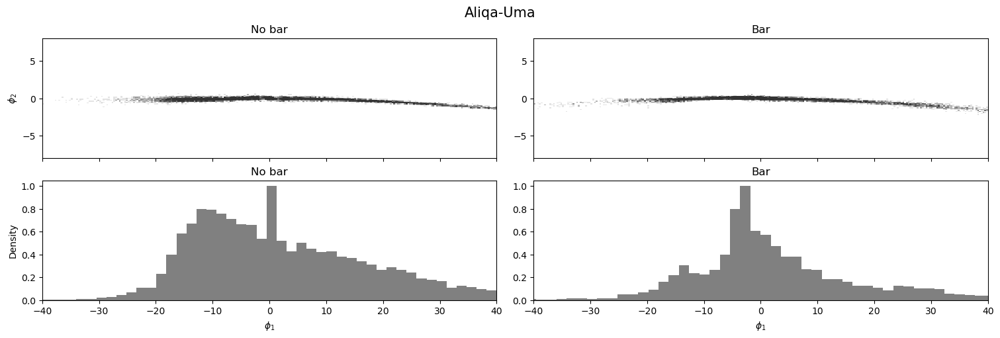

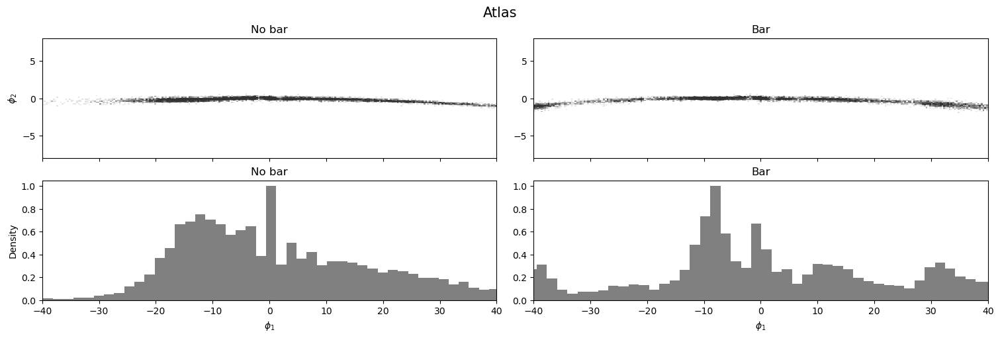

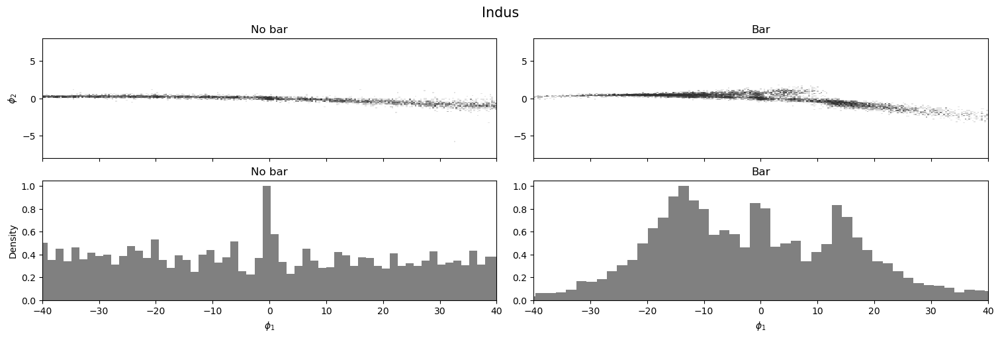

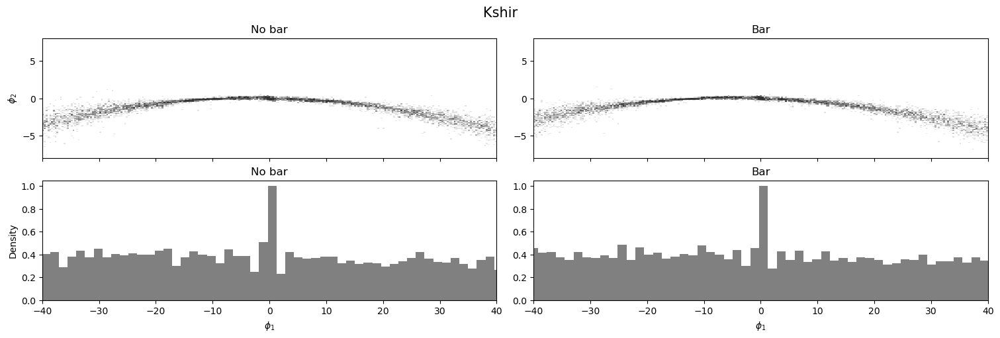

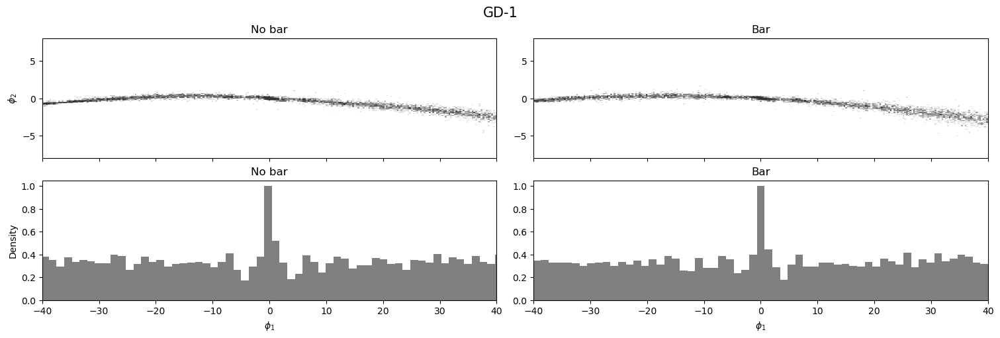

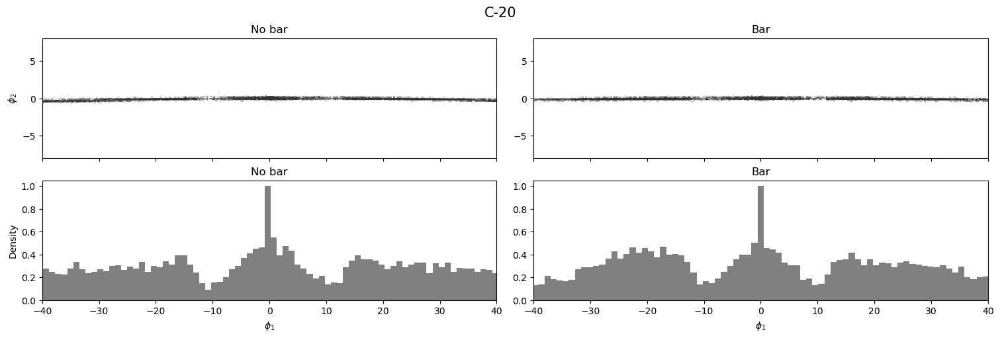

In [244]:
for index in range(7):
    rotate_stream(streams_bar[index], streams_nobar[index], pros_now_bar[index], names[index])